#SALES DATA --> kaggle


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from google.colab import files
warnings.filterwarnings('ignore')
print("✅ All dependencies successfully imported!")

✅ All dependencies successfully imported!


In [ ]:
from google.colab import files

uploaded = files.upload()

Saving sales_data.csv to sales_data (1).csv


In [ ]:
df = pd.read_csv("sales_data.csv")
print("✅ Dataset loaded successfully!")

✅ Dataset loaded successfully!


#Data Inspection

In [ ]:
print("Shape:", df.shape)

print("\nColumns:")
print(df.columns.tolist())

print("\nDataset Info:")
df.info()

print("\nMissing Values:")
print(df.isnull().sum())

print("\nDuplicate Rows:")
print(df.duplicated().sum())

Shape: (76000, 16)

Columns:
['Date', 'Store ID', 'Product ID', 'Category', 'Region', 'Inventory Level', 'Units Sold', 'Units Ordered', 'Price', 'Discount', 'Weather Condition', 'Promotion', 'Competitor Pricing', 'Seasonality', 'Epidemic', 'Demand']

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                76000 non-null  object 
 1   Store ID            76000 non-null  object 
 2   Product ID          76000 non-null  object 
 3   Category            76000 non-null  object 
 4   Region              76000 non-null  object 
 5   Inventory Level     76000 non-null  int64  
 6   Units Sold          76000 non-null  int64  
 7   Units Ordered       76000 non-null  int64  
 8   Price               76000 non-null  float64
 9   Discount            76000 non-null  int64  
 10  Weather Condition   76000 non-nul

In [ ]:
df.describe()

,Inventory Level,Units Sold,Units Ordered,Price,Discount,Promotion,Competitor Pricing,Epidemic,Demand
count,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000
mean,301.062842,88.827316,89.090645,67.726028,9.087039,0.328947,69.454029,0.200000,104.317158
std,226.510161,43.994525,162.404627,39.377899,7.475781,0.469834,40.943818,0.400003,46.964801
min,0.000000,0.000000,0.000000,4.740000,0.000000,0.000000,4.290000,0.000000,4.000000
25%,136.000000,58.000000,0.000000,31.997500,5.000000,0.000000,32.620000,0.000000,71.000000
50%,227.000000,84.000000,0.000000,64.500000,10.000000,0.000000,65.700000,0.000000,100.000000
75%,408.000000,114.000000,121.000000,95.830000,10.000000,1.000000,97.932500,0.000000,133.000000
max,2267.000000,426.000000,1616.000000,228.030000,25.000000,1.000000,261.220000,1.000000,430.000000


In [ ]:
df.describe(include='object')

,Date,Store ID,Product ID,Category,Region,Weather Condition,Seasonality
count,76000,76000,76000,76000,76000,76000,76000
unique,760,5,20,5,4,4,4
top,2024-01-30,S001,P0001,Groceries,North,Cloudy,Winter
freq,100,15200,3800,30400,30400,24360,21000


#Checking For NUll Values

In [ ]:
#count NUll Values
df.isnull().sum()

,0
Date,0
Store ID,0
Product ID,0
Category,0
Region,0
Inventory Level,0
Units Sold,0
Units Ordered,0
Price,0
Discount,0


#Start Date and End Date

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])

df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

In [ ]:
print("Start Date:", df['Date'].min())
print("End Date:", df['Date'].max())

Start Date: 2022-01-01 00:00:00
End Date: 2024-01-30 00:00:00


In [ ]:
df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year
print(df['Year'].value_counts().sort_index())

Year
2022    36500
2023    36500
2024     3000
Name: count, dtype: int64


#Sales Per Year


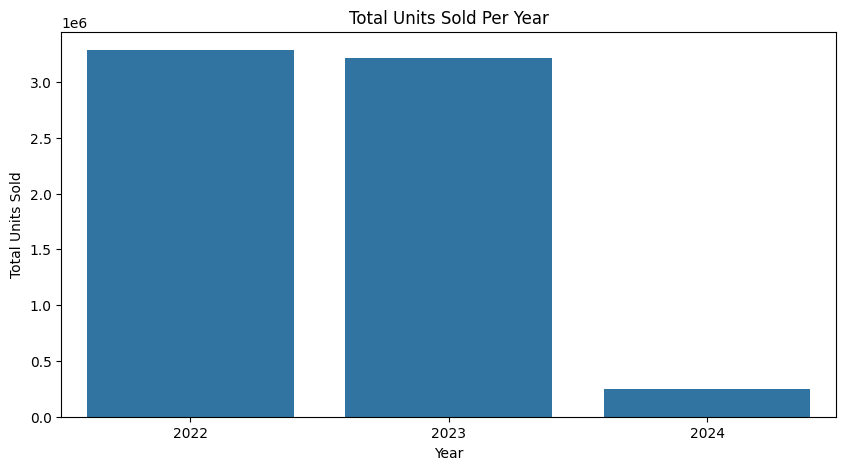

In [ ]:
yearly_sales = df.groupby('Year')['Units Sold'].sum()

plt.figure(figsize=(10, 5))

sns.barplot(
    x=yearly_sales.index,
    y=yearly_sales.values
)

plt.title('Total Units Sold Per Year')
plt.xlabel('Year')
plt.ylabel('Total Units Sold')

plt.show()

#Revenue Per Year

In [ ]:
df['Revenue'] = (
    df['Units Sold'] *
    df['Price'] *
    (1 - df['Discount'] / 100)
)

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year
yearly_revenue = df.groupby('Year')['Revenue'].sum()
print("Yearly Earnings:")
print(yearly_revenue.round(2))

Yearly Earnings:
Year
2022    2.012313e+08
2023    1.961494e+08
2024    1.520993e+07
Name: Revenue, dtype: float64


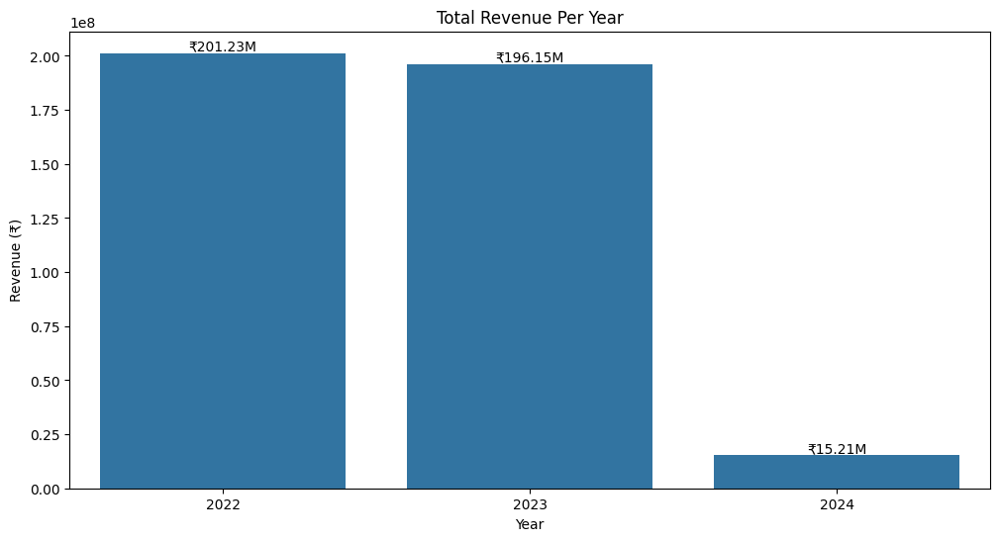

In [ ]:
plt.figure(figsize=(12, 6))

ax = sns.barplot(
    x=yearly_revenue.index,
    y=yearly_revenue.values
)

for i, value in enumerate(yearly_revenue.values):
    ax.text(
        i,
        value,
        f'₹{value/1_000_000:.2f}M',
        ha='center',
        va='bottom'
    )

plt.title('Total Revenue Per Year')
plt.xlabel('Year')
plt.ylabel('Revenue (₹)')

plt.show()

In [ ]:
yearly_summary = yearly_revenue.reset_index()
yearly_summary.columns = ['Year', 'Total Revenue']
yearly_summary['Total Revenue'] = (
    yearly_summary['Total Revenue'].round(2)
)
display(yearly_summary)

#Revenue Per Region


In [ ]:
region_revenue = (
    df.groupby('Region')['Revenue']
    .sum()
    .sort_values(ascending=False)
)

print("Revenue by Region:")
print(region_revenue.round(2))

Revenue by Region:
Region
North    1.541444e+08
East     8.925563e+07
West     8.559825e+07
South    8.359233e+07
Name: Revenue, dtype: float64


In [ ]:
region_summary = region_revenue.reset_index()

region_summary.columns = ['Region', 'Total Revenue']

region_summary['Total Revenue'] = region_summary['Total Revenue'].round(2)

display(region_summary)

,Region,Total Revenue
0,North,1.541444e+08
1,East,8.925563e+07
2,West,8.559825e+07
3,South,8.359233e+07


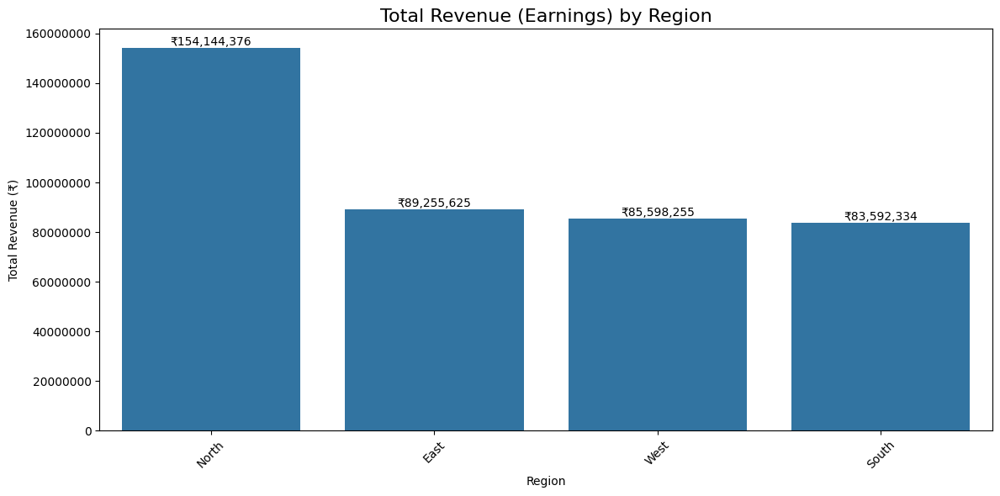

In [ ]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=region_revenue.index,
    y=region_revenue.values
)
# Add exact earnings on each bar
for i, value in enumerate(region_revenue.values):
    ax.text(
        i,
        value,
        f'₹{value:,.0f}',
        ha='center',
        va='bottom',
        fontsize=10
    )
plt.title('Total Revenue (Earnings) by Region', fontsize=16)
plt.xlabel('Region')
plt.ylabel('Total Revenue (₹)')
plt.ticklabel_format(style='plain', axis='y')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

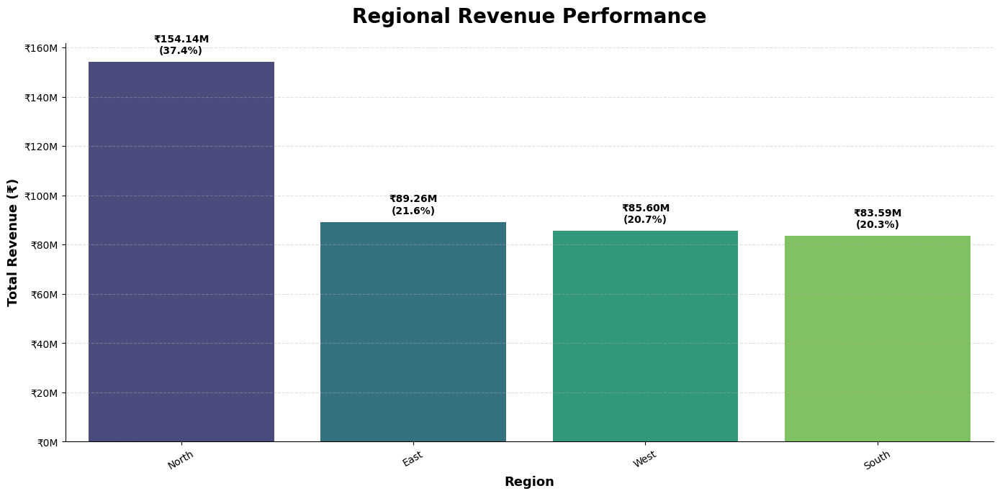

In [ ]:

region_revenue_sorted = region_revenue.sort_values(
    ascending=False
)

total_revenue = region_revenue_sorted.sum()

revenue_percentage = (
    region_revenue_sorted / total_revenue
) * 100


# ==========================================
# CREATE FIGURE
# ==========================================

plt.figure(figsize=(14, 7))

# Create color gradient
colors = sns.color_palette(
    "viridis",
    len(region_revenue_sorted)
)


# ==========================================
# BAR PLOT
# ==========================================

ax = sns.barplot(
    x=region_revenue_sorted.index,
    y=region_revenue_sorted.values,
    palette=colors
)


# ==========================================
# ADD VALUE + PERCENTAGE LABELS
# ==========================================

max_value = region_revenue_sorted.max()

for i, (value, percentage) in enumerate(
    zip(
        region_revenue_sorted.values,
        revenue_percentage.values
    )
):

    ax.text(
        i,
        value + max_value * 0.015,
        f'₹{value/1e6:.2f}M\n({percentage:.1f}%)',
        ha='center',
        va='bottom',
        fontsize=10,
        fontweight='bold'
    )


# ==========================================
# FORMATTING
# ==========================================

plt.title(
    'Regional Revenue Performance',
    fontsize=20,
    fontweight='bold',
    pad=20
)

plt.xlabel(
    'Region',
    fontsize=13,
    fontweight='bold'
)

plt.ylabel(
    'Total Revenue (₹)',
    fontsize=13,
    fontweight='bold'
)


# Format Y-axis into Millions
ax.yaxis.set_major_formatter(
    plt.FuncFormatter(
        lambda x, pos: f'₹{x/1e6:.0f}M'
    )
)


# Grid
plt.grid(
    axis='y',
    linestyle='--',
    alpha=0.4
)


# Rotate labels
plt.xticks(rotation=30)

# Remove unnecessary borders
sns.despine()

plt.tight_layout()

plt.show()

In [ ]:
df.columns

Index(['Date', 'Store ID', 'Product ID', 'Category', 'Region',
       'Inventory Level', 'Units Sold', 'Units Ordered', 'Price', 'Discount',
       'Weather Condition', 'Promotion', 'Competitor Pricing', 'Seasonality',
       'Epidemic', 'Demand', 'Year', 'Month', 'Day', 'Revenue'],
      dtype='object')

#Revenue Per Store And Top Store

In [ ]:
store_revenue = (
    df.groupby('Store ID')['Revenue']
    .sum()
    .sort_values(ascending=False)
)

print(store_revenue.round(2))

Store ID
S003    89255625.46
S004    85598254.71
S002    83592333.88
S001    81555358.44
S005    72589017.34
Name: Revenue, dtype: float64


In [ ]:
store_summary = store_revenue.reset_index()

store_summary.columns = ['Store ID', 'Total Revenue']

store_summary['Total Revenue'] = (
    store_summary['Total Revenue'].round(2)
)

display(store_summary)

,Store ID,Total Revenue
0,S003,89255625.46
1,S004,85598254.71
2,S002,83592333.88
3,S001,81555358.44
4,S005,72589017.34


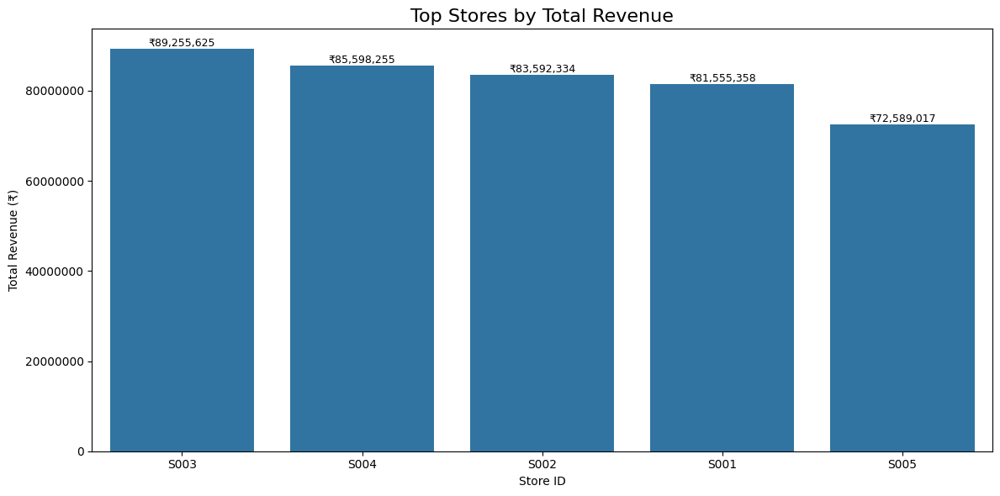

In [ ]:
top_stores = store_revenue.sort_values(ascending=False).head(10)

store_df = top_stores.reset_index()
store_df.columns = ['Store ID', 'Revenue']

store_df['Revenue Percentage'] = (
    store_df['Revenue'] / store_df['Revenue'].sum() * 100
)

store_df['Revenue (Millions)'] = store_df['Revenue'] / 1e6

fig = px.bar(
    store_df,
    x='Store ID',
    y='Revenue',
    color='Revenue',
    text='Revenue (Millions)',
    title='Top Stores by Total Revenue',
    hover_data={
        'Revenue': ':,.0f',
        'Revenue Percentage': ':.2f'
    },
    color_continuous_scale='Viridis'
)

fig.update_traces(
    texttemplate='₹%{text:.2f}M',
    textposition='outside',
    cliponaxis=False
)

fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    title_font_size=22,
    xaxis_title='Store ID',
    yaxis_title='Total Revenue (₹)',
    height=650
)

fig.update_yaxes(
    tickprefix='₹',
    tickformat='.2s'
)

fig.show()

In [ ]:
top__summary = store_revenue.head(10).reset_index()

top__summary.columns = ['Store ID', 'Revenue']

top__summary['Revenue'] = top__summary['Revenue'].apply(
    lambda x: f'₹{x:,.2f}'
)

display(top__summary)

,Store ID,Revenue
0,S003,"₹89,255,625.47"
1,S004,"₹85,598,254.71"
2,S002,"₹83,592,333.88"
3,S001,"₹81,555,358.44"
4,S005,"₹72,589,017.34"


#Units Sold By category

In [ ]:
category_sales = (
    df.groupby('Category')['Units Sold']
    .sum()
    .sort_values(ascending=False)
)

print(category_sales)

Category
Groceries      3127335
Clothing       1150873
Furniture       880654
Toys            834679
Electronics     757335
Name: Units Sold, dtype: int64


In [ ]:
category_sales_summary = category_sales.reset_index()

category_sales_summary.columns = ['Category', 'Total Units Sold']

display(category_sales_summary)

,Category,Total Units Sold
0,Groceries,3127335
1,Clothing,1150873
2,Furniture,880654
3,Toys,834679
4,Electronics,757335


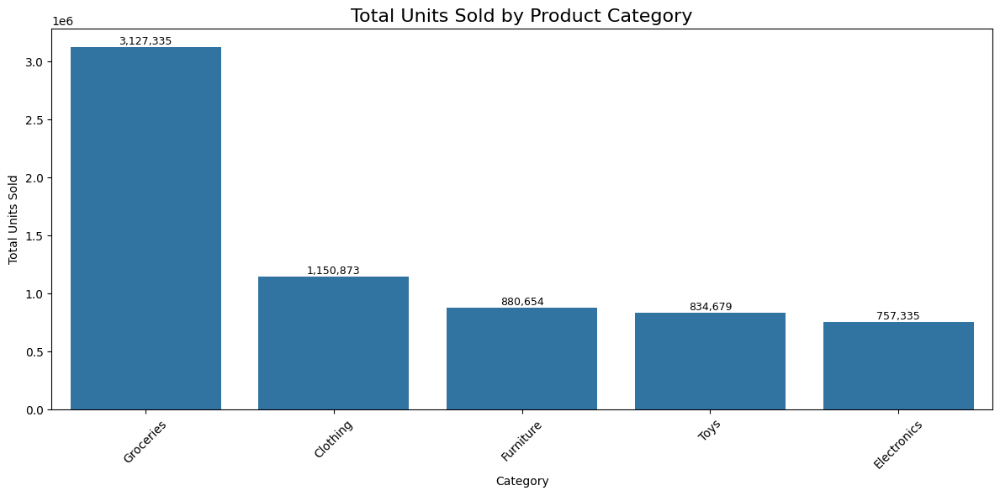

In [ ]:
plt.figure(figsize=(12, 6))

ax = sns.barplot(
    x=category_sales.index,
    y=category_sales.values
)

# Add exact figures
for i, value in enumerate(category_sales.values):
    ax.text(
        i,
        value,
        f'{value:,.0f}',
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.title('Total Units Sold by Product Category', fontsize=16)
plt.xlabel('Category')
plt.ylabel('Total Units Sold')

plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [ ]:
import plotly.express as px

# Sort categories by total units sold
category_sales_sorted = category_sales.sort_values(ascending=False)

# Convert the Series into a DataFrame
category_df = category_sales_sorted.reset_index()
category_df.columns = ['Category', 'Units Sold']

# Calculate percentage contribution
category_df['Percentage'] = (
    category_df['Units Sold']
    / category_df['Units Sold'].sum()
    * 100
)

# Create interactive bar chart
fig = px.bar(
    category_df,
    x='Category',
    y='Units Sold',
    color='Units Sold',
    text='Units Sold',
    title='Total Units Sold by Product Category',
    hover_data={
        'Units Sold': ':,.0f',
        'Percentage': ':.2f'
    },
    color_continuous_scale='Viridis'
)

# Format labels
fig.update_traces(
    texttemplate='%{text:,.0f}',
    textposition='outside',
    cliponaxis=False
)

# Configure chart layout
fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    title_font_size=20,
    xaxis_title='Product Category',
    yaxis_title='Total Units Sold',
    height=600
)

fig.update_yaxes(tickformat=',')

fig.show()

In [ ]:
categorical_cols = [
    'Store ID',
    'Product ID',
    'Category',
    'Region',
    'Weather Condition',
    'Promotion',
    'Seasonality',
    'Epidemic'
]

for col in categorical_cols:
    print(f"\n{'='*40}")
    print(f"Frequency of {col}")
    print('='*40)

    print(df[col].value_counts().head(10))


Frequency of Store ID
Store ID
S001    15200
S002    15200
S003    15200
S004    15200
S005    15200
Name: count, dtype: int64

Frequency of Product ID
Product ID
P0001    3800
P0002    3800
P0003    3800
P0004    3800
P0005    3800
P0006    3800
P0007    3800
P0008    3800
P0009    3800
P0010    3800
Name: count, dtype: int64

Frequency of Category
Category
Groceries      30400
Furniture      13680
Clothing       12160
Toys           10640
Electronics     9120
Name: count, dtype: int64

Frequency of Region
Region
North    30400
South    15200
East     15200
West     15200
Name: count, dtype: int64

Frequency of Weather Condition
Weather Condition
Cloudy    24360
Sunny     22980
Rainy     17500
Snowy     11160
Name: count, dtype: int64

Frequency of Promotion
Promotion
0    51000
1    25000
Name: count, dtype: int64

Frequency of Seasonality
Seasonality
Winter    21000
Spring    18400
Summer    18400
Autumn    18200
Name: count, dtype: int64

Frequency of Epidemic
Epidemic
0    60800


In [ ]:
store_frequency = df['Store ID'].value_counts()

print(store_frequency.head(10))

Store ID
S001    15200
S002    15200
S003    15200
S004    15200
S005    15200
Name: count, dtype: int64


In [ ]:
promotion_revenue = (
    df.groupby('Promotion')['Revenue']
    .sum()
    .sort_values(ascending=False)
)

print("Total Revenue by Promotion:")
print(promotion_revenue.round(2))

Total Revenue by Promotion:
Promotion
0    2.720829e+08
1    1.405077e+08
Name: Revenue, dtype: float64


In [ ]:
promotion_summary = (
    df.groupby('Promotion')['Revenue']
    .agg(
        Transactions='count',
        Total_Revenue='sum',
        Average_Revenue='mean'
    )
    .sort_values('Total_Revenue', ascending=False)
)

promotion_summary = promotion_summary.round(2)

display(promotion_summary)

,Transactions,Total_Revenue,Average_Revenue
Promotion,,,
0,51000,2.720829e+08,5334.96
1,25000,1.405077e+08,5620.31


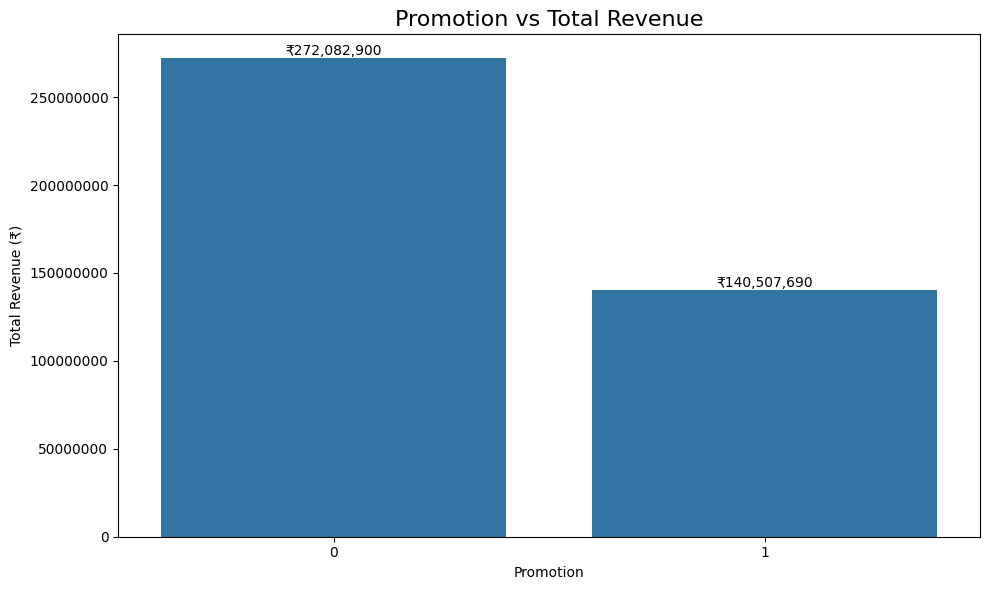

In [ ]:
plt.figure(figsize=(10, 6))

ax = sns.barplot(
    x=promotion_revenue.index,
    y=promotion_revenue.values
)

# Add exact revenue
for i, value in enumerate(promotion_revenue.values):
    ax.text(
        i,
        value,
        f'₹{value:,.0f}',
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.title('Promotion vs Total Revenue', fontsize=16)
plt.xlabel('Promotion')
plt.ylabel('Total Revenue (₹)')

plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

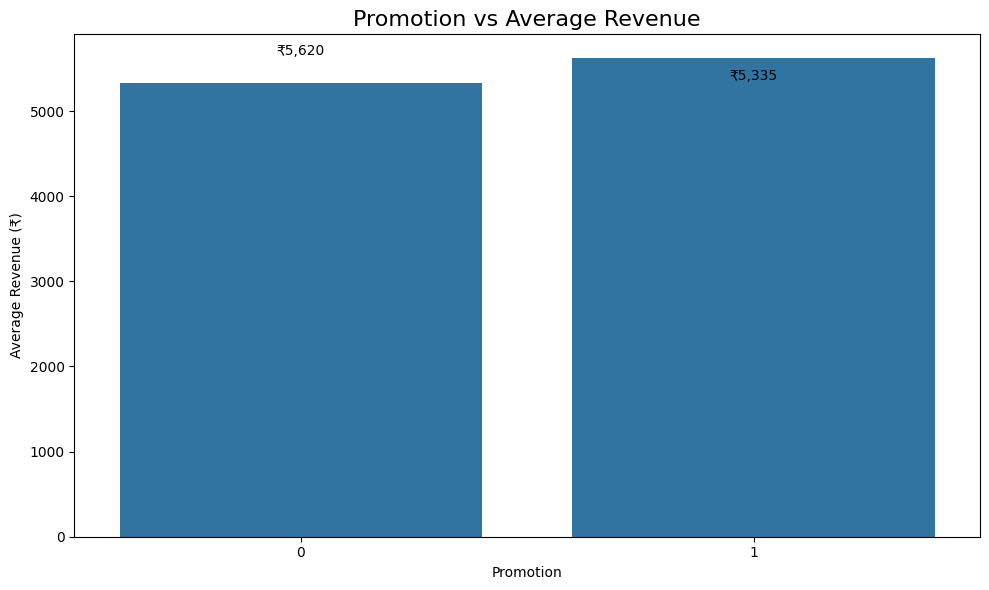

In [ ]:
avg_promotion_revenue = (
    df.groupby('Promotion')['Revenue']
    .mean()
    .sort_values(ascending=False)
)

plt.figure(figsize=(10, 6))

ax = sns.barplot(
    x=avg_promotion_revenue.index,
    y=avg_promotion_revenue.values
)

for i, value in enumerate(avg_promotion_revenue.values):
    ax.text(
        i,
        value,
        f'₹{value:,.0f}',
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.title('Promotion vs Average Revenue', fontsize=16)
plt.xlabel('Promotion')
plt.ylabel('Average Revenue (₹)')

plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

#Discount

In [ ]:
print(df['Discount'].describe())
print(df['Discount'].value_counts().sort_index())

count    76000.000000
mean         9.087039
std          7.475781
min          0.000000
25%          5.000000
50%         10.000000
75%         10.000000
max         25.000000
Name: Discount, dtype: float64
Discount
0     17126
5     16918
10    23298
15     6245
20     6191
25     6222
Name: count, dtype: int64


In [ ]:
discount_sales = (
    df.groupby('Discount')['Units Sold']
    .mean()
    .sort_index()
)
print(discount_sales.round(2))

Discount
0      81.57
5      81.69
10     87.66
15    102.88
20    103.77
25    103.59
Name: Units Sold, dtype: float64


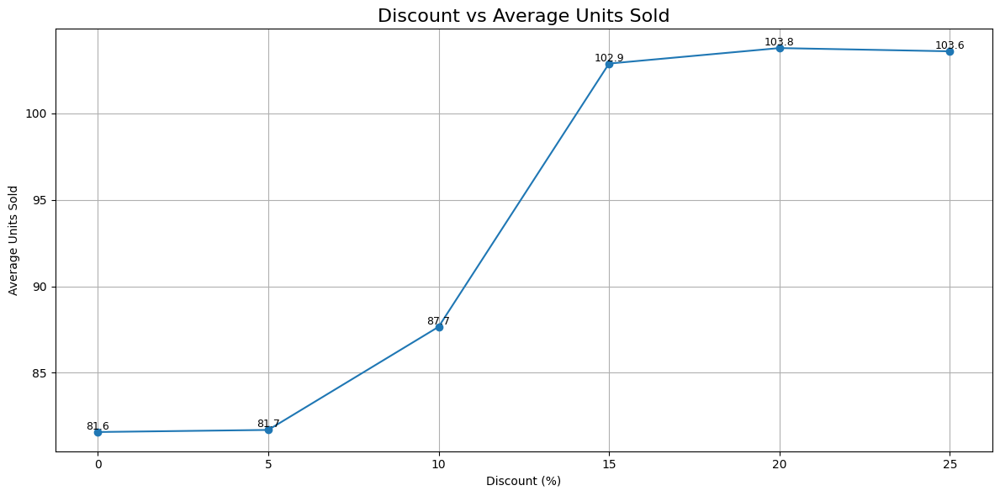

In [ ]:
plt.figure(figsize=(12, 6))

plt.plot(
    discount_sales.index,
    discount_sales.values,
    marker='o'
)

# Add exact values
for x, y in zip(discount_sales.index, discount_sales.values):
    plt.text(
        x,
        y,
        f'{y:.1f}',
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.title('Discount vs Average Units Sold', fontsize=16)
plt.xlabel('Discount (%)')
plt.ylabel('Average Units Sold')

plt.grid(True)
plt.tight_layout()
plt.show()


#The Discount vs Average Units Sold analysis shows that sales increase as discount rates rise, particularly between 10% and 15%. Average units sold reaches its maximum at approximately 20% discount. Beyond this point, increasing the discount to 25% does not result in additional sales growth, indicating diminishing returns. Therefore, excessive discounting may not be beneficial for the business

In [ ]:
import plotly.express as px

# Convert discount_sales Series into a DataFrame
discount_df = discount_sales.reset_index()
discount_df.columns = ['Discount', 'Average Units Sold']

# Create interactive line chart
fig = px.line(
    discount_df,
    x='Discount',
    y='Average Units Sold',
    markers=True,
    title='Discount vs Average Units Sold',
    hover_data={
        'Discount': ':.2f',
        'Average Units Sold': ':.2f'
    }
)

# Add value labels
fig.update_traces(
    mode='lines+markers+text',
    text=discount_df['Average Units Sold'].round(1),
    textposition='top center'
)

# Configure chart layout
fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    title_font_size=20,
    xaxis_title='Discount (%)',
    yaxis_title='Average Units Sold',
    height=600
)

fig.show()

#correlation Between Discount and units sold

In [ ]:
correlation = df['Discount'].corr(df['Units Sold'])
print("Correlation between Discount and Units Sold:", round(correlation, 3))

Correlation between Discount and Units Sold: 0.184


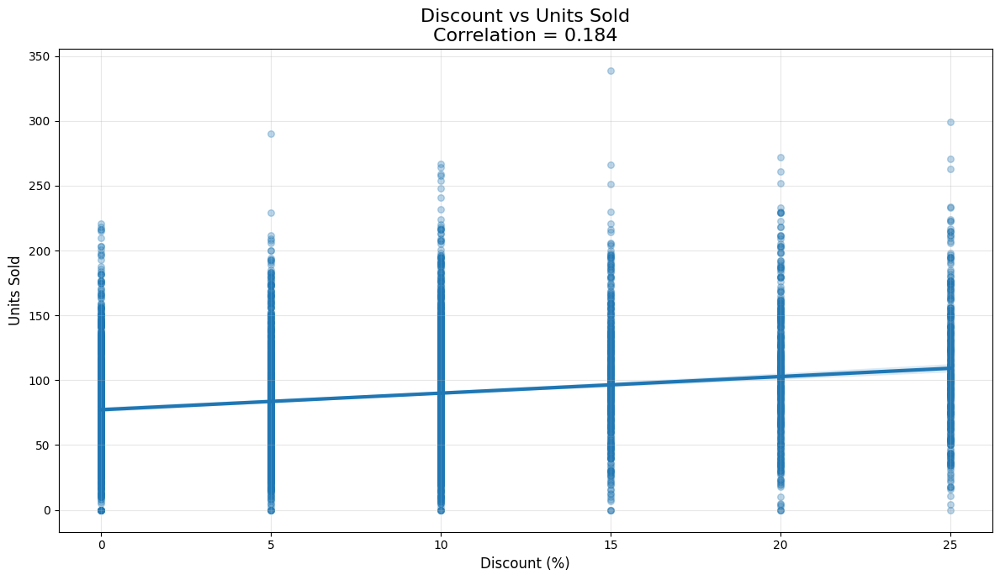

In [ ]:
plt.figure(figsize=(12, 7))

sample_df = df.sample(5000, random_state=42)

sns.regplot(
    data=sample_df,
    x='Discount',
    y='Units Sold',
    scatter_kws={'alpha': 0.3, 's': 30},
    line_kws={'linewidth': 3}
)

# Calculate correlation
corr = df['Discount'].corr(df['Units Sold'])

plt.title(
    f'Discount vs Units Sold\nCorrelation = {corr:.3f}',
    fontsize=16
)

plt.xlabel('Discount (%)', fontsize=12)
plt.ylabel('Units Sold', fontsize=12)

plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px
import numpy as np

# Create a sample for visualization
sample_df = df.sample(5000, random_state=42)

# Calculate correlation
corr = df['Discount'].corr(df['Units Sold'])

# Create scatter plot with trendline
fig = px.scatter(
    sample_df,
    x='Discount',
    y='Units Sold',
    trendline='ols',
    opacity=0.3,
    title=f'Discount vs Units Sold (Correlation = {corr:.3f})',
    labels={
        'Discount': 'Discount (%)',
        'Units Sold': 'Units Sold'
    }
)

# Configure chart layout
fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    title_font_size=20,
    height=650
)

fig.update_traces(
    marker=dict(size=6)
)

fig.show()

In [ ]:
import plotly.express as px

fig = px.box(
    df,
    x='Discount',
    y='Units Sold',
    points='outliers',
    title='Distribution of Units Sold Across Discount Levels',
    labels={
        'Discount': 'Discount (%)',
        'Units Sold': 'Units Sold'
    }
)

fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    title_font_size=20,
    height=600
)

fig.show()

weak positive relationship between Discount and Units Sold.
As the discount increases, units sold tend to increase slightly, but the relationship is not strong.So:

Discounts may influence sales, but discount alone is not a strong predictor of Units Sold.

#Demand According to Seasons


In [ ]:
season_demand = (
    df.groupby('Seasonality')['Demand']
    .agg(
        Average_Demand='mean',
        Total_Demand='sum',
        Records='count'
    )
    .sort_values('Average_Demand', ascending=False)
)

display(season_demand.round(2))

,Average_Demand,Total_Demand,Records
Seasonality,,,
Summer,112.86,2076539,18400
Autumn,103.42,1882298,18200
Winter,103.41,2171530,21000
Spring,97.70,1797737,18400


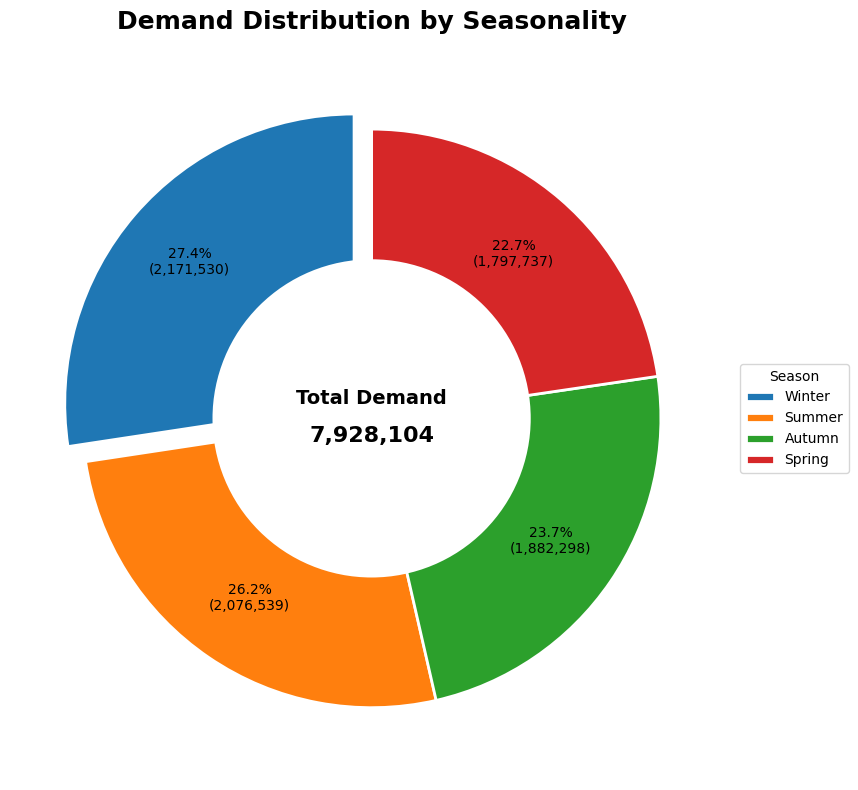

In [ ]:
# Calculate total demand by season
season_demand = (
    df.groupby('Seasonality')['Demand']
    .sum()
    .sort_values(ascending=False)
)

labels = season_demand.index
values = season_demand.values

# Explode the largest season
explode = [0.08 if value == values.max() else 0
           for value in values]

# Create figure
fig, ax = plt.subplots(figsize=(10, 8))

# Custom function for percentage + exact value
def autopct_format(values):
    def my_format(pct):
        total = sum(values)
        value = int(round(pct * total / 100))
        return f'{pct:.1f}%\n({value:,})'
    return my_format


wedges, texts, autotexts = ax.pie(
    values,
    explode=explode,
    autopct=autopct_format(values),
    startangle=90,
    pctdistance=0.75,
    wedgeprops={
        'edgecolor': 'white',
        'linewidth': 2
    }
)

# Create donut effect
centre_circle = plt.Circle(
    (0, 0),
    0.55,
    fc='white'
)

ax.add_artist(centre_circle)

# Add total demand in center
ax.text(
    0, 0.05,
    'Total Demand',
    ha='center',
    fontsize=14,
    fontweight='bold'
)

ax.text(
    0, -0.08,
    f'{values.sum():,}',
    ha='center',
    fontsize=16,
    fontweight='bold'
)

# Legend
ax.legend(
    wedges,
    labels,
    title='Season',
    loc='center left',
    bbox_to_anchor=(1, 0.5)
)

plt.title(
    'Demand Distribution by Seasonality',
    fontsize=18,
    fontweight='bold',
    pad=20
)

plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px

# Calculate total demand by season
season_demand = (
    df.groupby('Seasonality')['Demand']
    .sum()
    .sort_values(ascending=False)
)

# Convert Series to DataFrame
season_df = season_demand.reset_index()
season_df.columns = ['Seasonality', 'Demand']

# Calculate percentage contribution
season_df['Percentage'] = (
    season_df['Demand']
    / season_df['Demand'].sum()
    * 100
)

# Create interactive donut chart
fig = px.pie(
    season_df,
    names='Seasonality',
    values='Demand',
    hole=0.5,
    title='Demand Distribution by Seasonality',
    hover_data={
        'Demand': ':,.0f',
        'Percentage': ':.2f'
    }
)

# Display percentage and demand values
fig.update_traces(
    textinfo='percent+label',
    textposition='inside',
    hovertemplate=(
        '<b>%{label}</b><br>'
        'Total Demand: %{value:,.0f}<br>'
        'Percentage: %{percent}'
        '<extra></extra>'
    )
)

# Configure layout
fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    title_font_size=20,
    height=600,
    legend_title='Seasonality'
)

# Add total demand at the center
fig.add_annotation(
    text=(
        f"<b>Total Demand</b><br>"
        f"{season_df['Demand'].sum():,.0f}"
    ),
    x=0.5,
    y=0.5,
    showarrow=False,
    font_size=16
)

fig.show()

In [ ]:
weather_sales = (
    df.groupby('Weather Condition')['Units Sold']
    .agg(
        Average_Units_Sold='mean',
        Total_Units_Sold='sum',
        Records='count'
    )
    .sort_values('Average_Units_Sold', ascending=False)
)

display(weather_sales.round(2))

,Average_Units_Sold,Total_Units_Sold,Records
Weather Condition,,,
Sunny,97.03,2229702,22980
Cloudy,89.63,2183274,24360
Rainy,81.97,1434515,17500
Snowy,80.95,903385,11160


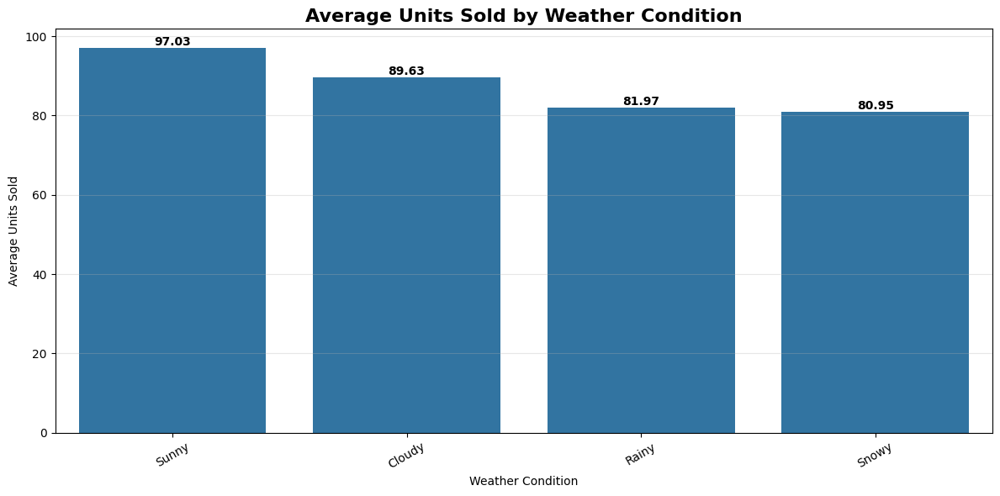

In [ ]:
plt.figure(figsize=(12, 6))
weather_avg = (
    df.groupby('Weather Condition')['Units Sold']
    .mean()
    .sort_values(ascending=False)
)

ax = sns.barplot(
    x=weather_avg.index,
    y=weather_avg.values
)

# Add exact values
for i, value in enumerate(weather_avg.values):
    ax.text(
        i,
        value,
        f'{value:.2f}',
        ha='center',
        va='bottom',
        fontsize=10,
        fontweight='bold'
    )

plt.title(
    'Average Units Sold by Weather Condition',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Weather Condition')
plt.ylabel('Average Units Sold')

plt.grid(axis='y', alpha=0.3)

plt.xticks(rotation=30)
plt.tight_layout()

plt.show()

In [ ]:
import plotly.express as px

weather_avg = (
    df.groupby('Weather Condition')['Units Sold']
    .mean()
    .sort_values(ascending=False)
)

weather_df = weather_avg.reset_index()
weather_df.columns = ['Weather Condition', 'Average Units Sold']

fig = px.bar(
    weather_df,
    x='Weather Condition',
    y='Average Units Sold',
    color='Average Units Sold',
    text='Average Units Sold',
    title='Average Units Sold by Weather Condition',
    hover_data={
        'Average Units Sold': ':.2f'
    },
    color_continuous_scale='Viridis'
)

fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside',
    cliponaxis=False
)

fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    title_font_size=20,
    xaxis_title='Weather Condition',
    yaxis_title='Average Units Sold',
    height=600
)

fig.show()

#Key observations


1.   Sunny weather has the highest average sales at 97.03 units.
2.   Snowy weather has the lowest average sales at 80.95 units.

Sales decline from:

Sunny → Cloudy → Rainy → Snowy



*   The difference between Sunny and Snowy is approximately:
97.03 - 80.95 = 16.08 units



* So, on average, Sunny conditions are associated with about 16 more units sold than Snowy conditions.

#Revenue Generated According to Weather


In [ ]:
weather_revenue = (
    df.groupby('Weather Condition')['Revenue']
    .agg(
        Total_Revenue='sum',
        Average_Revenue='mean',
        Transactions='count'
    )
    .sort_values('Total_Revenue', ascending=False)
)

display(weather_revenue.round(2))

,Total_Revenue,Average_Revenue,Transactions
Weather Condition,,,
Sunny,1.416104e+08,6162.33,22980
Cloudy,1.333317e+08,5473.39,24360
Rainy,8.390396e+07,4794.51,17500
Snowy,5.374454e+07,4815.82,11160


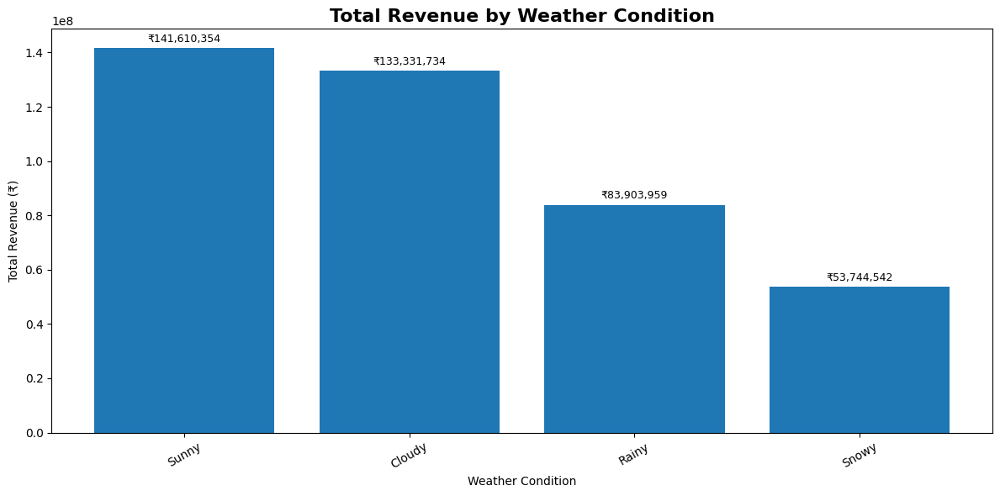

In [ ]:
weather_rev = (
    df.groupby('Weather Condition')['Revenue']
    .sum()
    .sort_values(ascending=False)
)

fig, ax = plt.subplots(figsize=(12, 6))

bars = ax.bar(
    weather_rev.index,
    weather_rev.values
)

# Exact values
ax.bar_label(
    bars,
    labels=[f'₹{x:,.0f}' for x in weather_rev.values],
    padding=3,
    fontsize=9
)

ax.set_title(
    'Total Revenue by Weather Condition',
    fontsize=16,
    fontweight='bold'
)

ax.set_xlabel('Weather Condition')
ax.set_ylabel('Total Revenue (₹)')

plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px

weather_rev = (
    df.groupby('Weather Condition')['Revenue']
    .sum()
    .sort_values(ascending=False)
)

weather_rev_df = weather_rev.reset_index()
weather_rev_df.columns = ['Weather Condition', 'Revenue']

weather_rev_df['Revenue (Millions)'] = (
    weather_rev_df['Revenue'] / 1e6
)

weather_rev_df['Percentage'] = (
    weather_rev_df['Revenue']
    / weather_rev_df['Revenue'].sum()
    * 100
)

fig = px.bar(
    weather_rev_df,
    x='Weather Condition',
    y='Revenue',
    color='Revenue',
    text='Revenue (Millions)',
    title='Total Revenue by Weather Condition',
    hover_data={
        'Revenue': ':,.0f',
        'Percentage': ':.2f'
    },
    color_continuous_scale='Viridis'
)

fig.update_traces(
    texttemplate='₹%{text:.2f}M',
    textposition='outside',
    cliponaxis=False
)

fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    title_font_size=20,
    xaxis_title='Weather Condition',
    yaxis_title='Total Revenue (₹)',
    height=600
)

fig.update_yaxes(
    tickprefix='₹',
    tickformat='.2s'
)

fig.show()

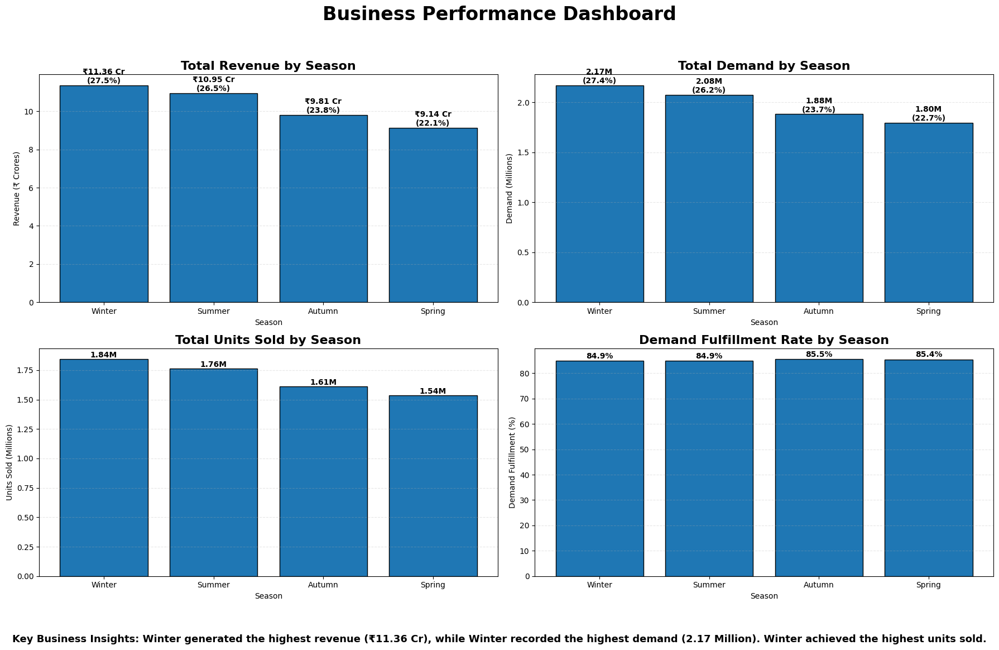

In [ ]:
def plot_business_dashboard(df):

    import matplotlib.pyplot as plt
    import numpy as np

    # --------------------------------------------------
    # Aggregate seasonal business metrics
    # --------------------------------------------------

    data = df.groupby('Seasonality').agg(
        Revenue=('Revenue', 'sum'),
        Demand=('Demand', 'sum'),
        Units_Sold=('Units Sold', 'sum'),
        Avg_Discount=('Discount', 'mean')
    )

    # Define logical season order
    season_order = ['Winter', 'Summer', 'Autumn', 'Spring']

    data = data.reindex(
        [season for season in season_order if season in data.index]
    )

    # --------------------------------------------------
    # Calculate additional business metrics
    # --------------------------------------------------

    total_revenue = data['Revenue'].sum()
    total_demand = data['Demand'].sum()
    total_units = data['Units_Sold'].sum()

    data['Revenue %'] = (
        data['Revenue'] / total_revenue * 100
    )

    data['Demand %'] = (
        data['Demand'] / total_demand * 100
    )

    data['Revenue per Unit'] = (
        data['Revenue'] / data['Units_Sold']
    )

    data['Demand Fulfillment %'] = (
        data['Units_Sold'] / data['Demand'] * 100
    )

    # --------------------------------------------------
    # Identify best-performing seasons
    # --------------------------------------------------

    best_revenue_season = data['Revenue'].idxmax()
    best_demand_season = data['Demand'].idxmax()
    best_units_season = data['Units_Sold'].idxmax()

    best_revenue = data.loc[
        best_revenue_season, 'Revenue'
    ]

    best_demand = data.loc[
        best_demand_season, 'Demand'
    ]

    # --------------------------------------------------
    # Create dashboard
    # --------------------------------------------------

    fig = plt.figure(figsize=(18, 12))

    gs = fig.add_gridspec(
        2,
        2,
        height_ratios=[1, 1]
    )

    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[1, 0])
    ax4 = fig.add_subplot(gs[1, 1])

    fig.suptitle(
        'Business Performance Dashboard',
        fontsize=24,
        fontweight='bold',
        y=0.97
    )

    # --------------------------------------------------
    # Chart 1: Revenue by Season
    # --------------------------------------------------

    bars1 = ax1.bar(
        data.index,
        data['Revenue'] / 1e7,
        edgecolor='black',
        linewidth=1
    )

    for bar, value, percentage in zip(
        bars1,
        data['Revenue'],
        data['Revenue %']
    ):

        ax1.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 0.1,
            f'₹{value/1e7:.2f} Cr\n({percentage:.1f}%)',
            ha='center',
            fontsize=10,
            fontweight='bold'
        )

    ax1.set_title(
        'Total Revenue by Season',
        fontsize=16,
        fontweight='bold'
    )

    ax1.set_xlabel('Season')
    ax1.set_ylabel('Revenue (₹ Crores)')

    ax1.grid(
        axis='y',
        linestyle='--',
        alpha=0.3
    )

    # --------------------------------------------------
    # Chart 2: Demand by Season
    # --------------------------------------------------

    bars2 = ax2.bar(
        data.index,
        data['Demand'] / 1e6,
        edgecolor='black',
        linewidth=1
    )

    for bar, value, percentage in zip(
        bars2,
        data['Demand'],
        data['Demand %']
    ):

        ax2.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 0.02,
            f'{value/1e6:.2f}M\n({percentage:.1f}%)',
            ha='center',
            fontsize=10,
            fontweight='bold'
        )

    ax2.set_title(
        'Total Demand by Season',
        fontsize=16,
        fontweight='bold'
    )

    ax2.set_xlabel('Season')
    ax2.set_ylabel('Demand (Millions)')

    ax2.grid(
        axis='y',
        linestyle='--',
        alpha=0.3
    )

    # --------------------------------------------------
    # Chart 3: Units Sold by Season
    # --------------------------------------------------

    bars3 = ax3.bar(
        data.index,
        data['Units_Sold'] / 1e6,
        edgecolor='black',
        linewidth=1
    )

    for bar, value in zip(
        bars3,
        data['Units_Sold']
    ):

        ax3.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            f'{value/1e6:.2f}M',
            ha='center',
            va='bottom',
            fontsize=10,
            fontweight='bold'
        )

    ax3.set_title(
        'Total Units Sold by Season',
        fontsize=16,
        fontweight='bold'
    )

    ax3.set_xlabel('Season')
    ax3.set_ylabel('Units Sold (Millions)')

    ax3.grid(
        axis='y',
        linestyle='--',
        alpha=0.3
    )

    # --------------------------------------------------
    # Chart 4: Demand Fulfillment Rate
    # --------------------------------------------------

    bars4 = ax4.bar(
        data.index,
        data['Demand Fulfillment %'],
        edgecolor='black',
        linewidth=1
    )

    for bar, value in zip(
        bars4,
        data['Demand Fulfillment %']
    ):

        ax4.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 1,
            f'{value:.1f}%',
            ha='center',
            fontsize=10,
            fontweight='bold'
        )

    ax4.set_title(
        'Demand Fulfillment Rate by Season',
        fontsize=16,
        fontweight='bold'
    )

    ax4.set_xlabel('Season')
    ax4.set_ylabel('Demand Fulfillment (%)')

    ax4.grid(
        axis='y',
        linestyle='--',
        alpha=0.3
    )

    # --------------------------------------------------
    # Add summary section
    # --------------------------------------------------

    insight = (
        f'Key Business Insights: '
        f'{best_revenue_season} generated the highest revenue '
        f'(₹{best_revenue/1e7:.2f} Cr), while '
        f'{best_demand_season} recorded the highest demand '
        f'({best_demand/1e6:.2f} Million). '
        f'{best_units_season} achieved the highest units sold.'
    )

    fig.text(
        0.5,
        0.02,
        insight,
        ha='center',
        fontsize=13,
        fontweight='bold',
        wrap=True
    )

    plt.tight_layout(
        rect=[0, 0.07, 1, 0.94]
    )

    plt.show()

    return data


season_summary = plot_business_dashboard(df)

#Weather condition Vs Demand


In [ ]:
weather_demand = (
    df.groupby('Weather Condition')['Demand']
    .agg(
        Average_Demand='mean',
        Total_Demand='sum',
        Demand_Std='std'
    )
    .sort_values('Average_Demand', ascending=False)
)

display(weather_demand.round(2))

,Average_Demand,Total_Demand,Demand_Std
Weather Condition,,,
Sunny,115.17,2646542,51.09
Cloudy,105.40,2567643,46.65
Rainy,95.11,1664368,42.64
Snowy,94.05,1049551,39.52


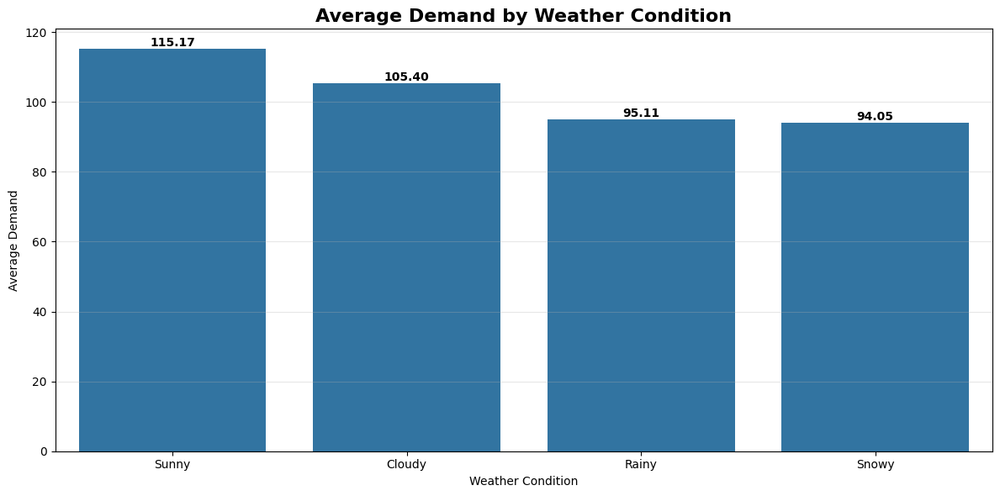

In [ ]:
weather_avg_demand = (
    df.groupby('Weather Condition')['Demand']
    .mean()
    .sort_values(ascending=False)
)

plt.figure(figsize=(12, 6))

ax = sns.barplot(
    x=weather_avg_demand.index,
    y=weather_avg_demand.values
)

for i, value in enumerate(weather_avg_demand.values):
    ax.text(
        i,
        value,
        f'{value:.2f}',
        ha='center',
        va='bottom',
        fontweight='bold'
    )

plt.title(
    'Average Demand by Weather Condition',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Weather Condition')
plt.ylabel('Average Demand')

plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

#Weather vs Units Sold vs Revenue

In [ ]:
weather_analysis = (
    df.groupby('Weather Condition')
    .agg(
        Avg_Units_Sold=('Units Sold', 'mean'),
        Avg_Demand=('Demand', 'mean'),
        Avg_Revenue=('Revenue', 'mean')
    )
    .round(2)
)

display(weather_analysis)

,Avg_Units_Sold,Avg_Demand,Avg_Revenue
Weather Condition,,,
Cloudy,89.63,105.40,5473.39
Rainy,81.97,95.11,4794.51
Snowy,80.95,94.05,4815.82
Sunny,97.03,115.17,6162.33


In [ ]:
weather_promotion = pd.pivot_table(
    df,
    values='Units Sold',
    index='Weather Condition',
    columns='Promotion',
    aggfunc='mean'
)

display(weather_promotion.round(2))

Promotion,0,1
Weather Condition,,
Cloudy,82.67,103.66
Rainy,75.34,95.60
Snowy,74.35,94.01
Sunny,89.45,112.79


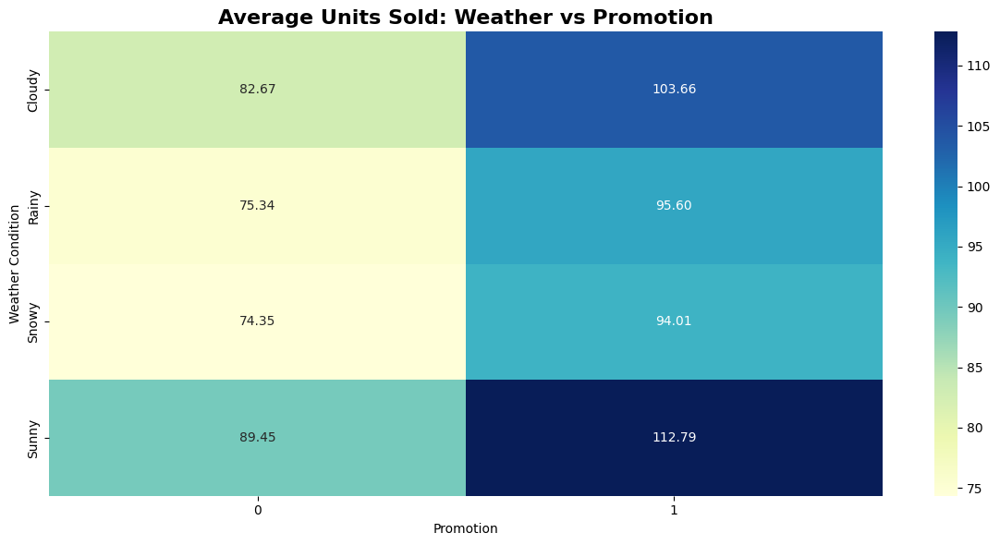

In [ ]:
plt.figure(figsize=(12, 6))

sns.heatmap(
    weather_promotion,
    annot=True,
    fmt='.2f',
    cmap='YlGnBu'
)

plt.title(
    'Average Units Sold: Weather vs Promotion',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Promotion')
plt.ylabel('Weather Condition')

plt.tight_layout()
plt.show()

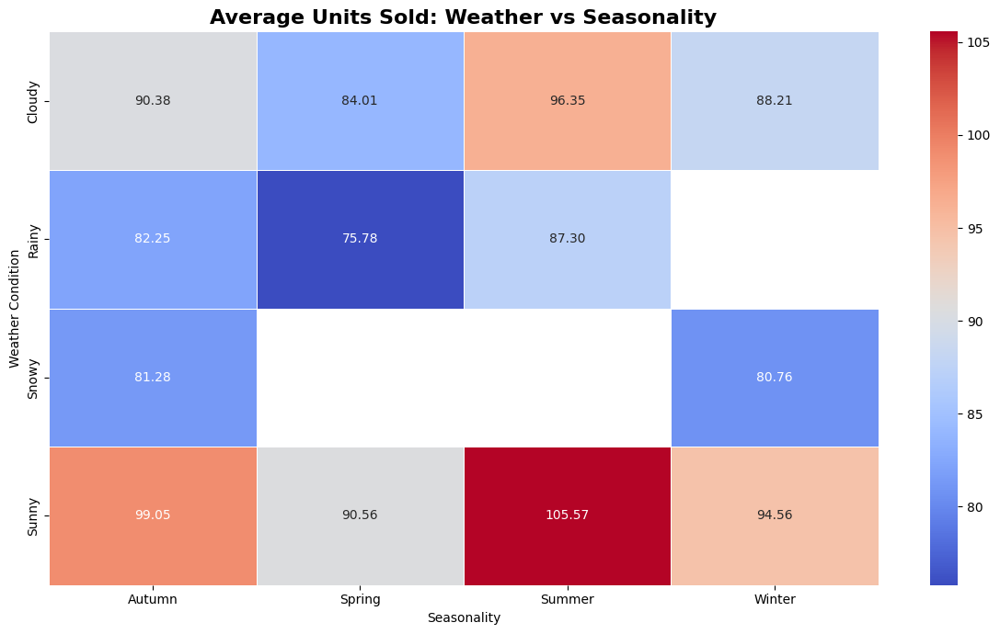

In [ ]:
weather_season = pd.pivot_table(
    df,
    values='Units Sold',
    index='Weather Condition',
    columns='Seasonality',
    aggfunc='mean'
)

plt.figure(figsize=(12, 7))

sns.heatmap(
    weather_season,
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    linewidths=0.5
)

plt.title(
    'Average Units Sold: Weather vs Seasonality',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Seasonality')
plt.ylabel('Weather Condition')

plt.tight_layout()
plt.show()

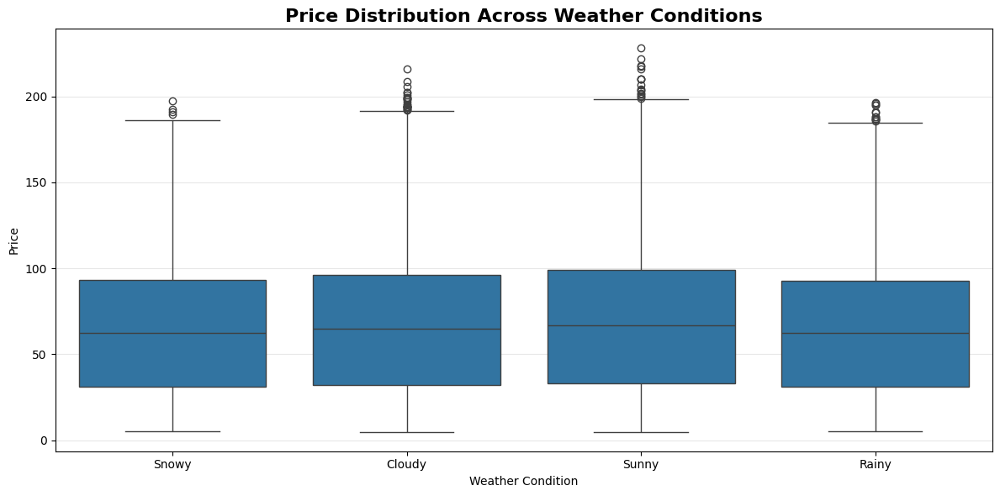

In [ ]:
plt.figure(figsize=(12, 6))

sns.boxplot(
    data=df,
    x='Weather Condition',
    y='Price'
)

plt.title(
    'Price Distribution Across Weather Conditions',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Weather Condition')
plt.ylabel('Price')

plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
weather_dashboard = (
    df.groupby('Weather Condition')
    .agg(
        Records=('Weather Condition', 'count'),
        Avg_Units_Sold=('Units Sold', 'mean'),
        Total_Units_Sold=('Units Sold', 'sum'),
        Avg_Demand=('Demand', 'mean'),
        Total_Revenue=('Revenue', 'sum'),
        Avg_Revenue=('Revenue', 'mean')
    )
    .sort_values('Total_Revenue', ascending=False)
)

display(weather_dashboard.round(2))

,Records,Avg_Units_Sold,Total_Units_Sold,Avg_Demand,Total_Revenue,Avg_Revenue
Weather Condition,,,,,,
Sunny,22980,97.03,2229702,115.17,1.416104e+08,6162.33
Cloudy,24360,89.63,2183274,105.40,1.333317e+08,5473.39
Rainy,17500,81.97,1434515,95.11,8.390396e+07,4794.51
Snowy,11160,80.95,903385,94.05,5.374454e+07,4815.82


In [ ]:
df['Inventory Group'] = pd.qcut(
    df['Inventory Level'],
    q=5,
    duplicates='drop'
)

inventory_analysis = (
    df.groupby('Inventory Group', observed=True)
    .agg(
        Average_Inventory=('Inventory Level', 'mean'),
        Average_Units_Sold=('Units Sold', 'mean'),
        Total_Units_Sold=('Units Sold', 'sum'),
        Average_Demand=('Demand', 'mean')
    )
    .reset_index()
)

display(inventory_analysis.round(2))

# Convert interval groups to readable labels
inventory_analysis['Inventory Group'] = (
    inventory_analysis['Inventory Group'].astype(str)
)



,Inventory Group,Average_Inventory,Average_Units_Sold,Total_Units_Sold,Average_Demand
0,"(-0.001, 123.0]",88.36,65.43,1013394,95.52
1,"(123.0, 183.0]",151.68,89.49,1341566,103.77
2,"(183.0, 287.0]",230.10,92.27,1395293,103.12
3,"(287.0, 460.0]",366.21,95.03,1444583,105.39
4,"(460.0, 2267.0]",670.69,102.40,1556040,113.95


In [ ]:
# Create interactive visualization
fig = px.bar(
    inventory_analysis,
    x='Inventory Group',
    y='Average_Units_Sold',
    color='Average_Units_Sold',
    text='Average_Units_Sold',
    title='Average Units Sold Across Inventory Levels',
    hover_data={
        'Average_Inventory': ':.2f',
        'Average_Units_Sold': ':.2f',
        'Total_Units_Sold': ':,.0f',
        'Average_Demand': ':.2f'
    },
    color_continuous_scale='Viridis'
)

fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside',
    cliponaxis=False
)

fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    title_font_size=20,
    xaxis_title='Inventory Level Group',
    yaxis_title='Average Units Sold',
    height=600
)

fig.update_xaxes(
    tickangle=-20
)

fig.show()

In [ ]:
inventory_demand_corr = df['Inventory Level'].corr(df['Demand'])

print(
    "Correlation between Inventory Level and Demand:",
    round(inventory_demand_corr, 3)
)

Correlation between Inventory Level and Demand: 0.127


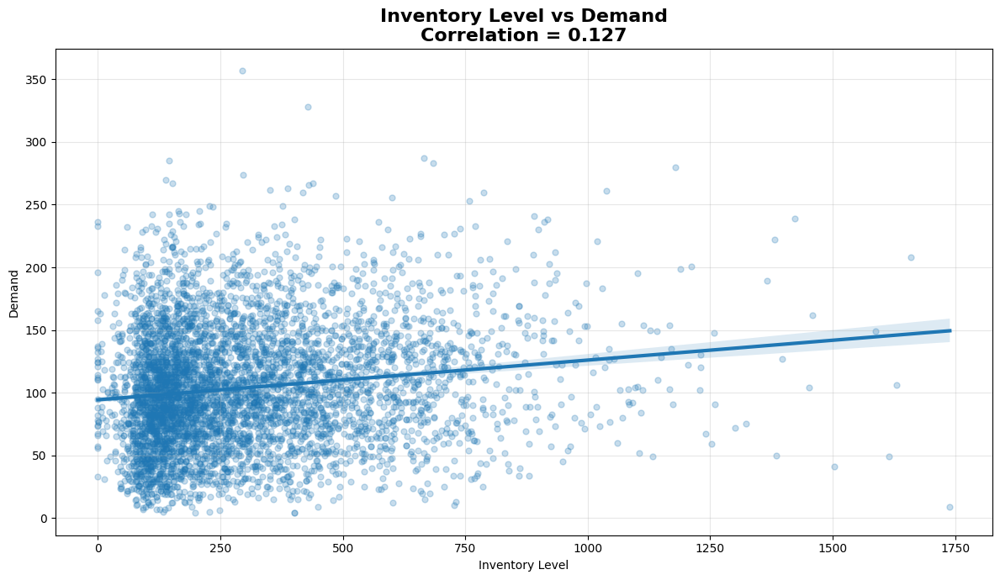

In [ ]:
sample_df = df.sample(5000, random_state=42)

plt.figure(figsize=(12, 7))

sns.regplot(
    data=sample_df,
    x='Inventory Level',
    y='Demand',
    scatter_kws={'alpha': 0.25, 's': 25},
    line_kws={'linewidth': 3}
)

plt.title(
    f'Inventory Level vs Demand\nCorrelation = {inventory_demand_corr:.3f}',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Inventory Level')
plt.ylabel('Demand')

plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()

#Epidemic vs Buisness performance


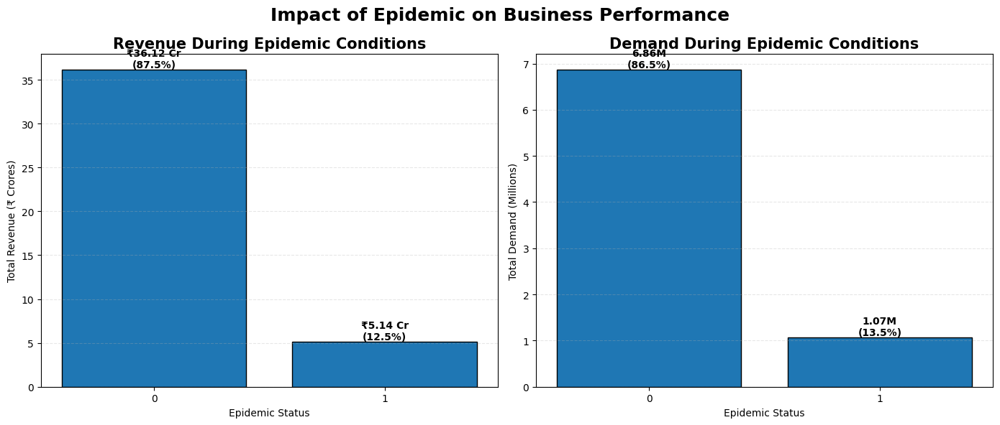

In [ ]:
def plot_epidemic_impact(df):

    data = df.groupby('Epidemic').agg(
        Revenue=('Revenue', 'sum'),
        Demand=('Demand', 'sum')
    )

    data['Revenue %'] = (
        data['Revenue'] / data['Revenue'].sum() * 100
    )

    data['Demand %'] = (
        data['Demand'] / data['Demand'].sum() * 100
    )

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    bars1 = axes[0].bar(
        data.index.astype(str),
        data['Revenue'] / 1e7,
        edgecolor='black',
        linewidth=1
    )

    for bar, value, percent in zip(
        bars1,
        data['Revenue'],
        data['Revenue %']
    ):
        axes[0].text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            f'₹{value/1e7:.2f} Cr\n({percent:.1f}%)',
            ha='center',
            va='bottom',
            fontweight='bold'
        )

    axes[0].set_title(
        'Revenue During Epidemic Conditions',
        fontsize=15,
        fontweight='bold'
    )

    axes[0].set_xlabel('Epidemic Status')
    axes[0].set_ylabel('Total Revenue (₹ Crores)')
    axes[0].grid(axis='y', linestyle='--', alpha=0.3)

    bars2 = axes[1].bar(
        data.index.astype(str),
        data['Demand'] / 1e6,
        edgecolor='black',
        linewidth=1
    )

    for bar, value, percent in zip(
        bars2,
        data['Demand'],
        data['Demand %']
    ):
        axes[1].text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            f'{value/1e6:.2f}M\n({percent:.1f}%)',
            ha='center',
            va='bottom',
            fontweight='bold'
        )

    axes[1].set_title(
        'Demand During Epidemic Conditions',
        fontsize=15,
        fontweight='bold'
    )

    axes[1].set_xlabel('Epidemic Status')
    axes[1].set_ylabel('Total Demand (Millions)')
    axes[1].grid(axis='y', linestyle='--', alpha=0.3)

    fig.suptitle(
        'Impact of Epidemic on Business Performance',
        fontsize=18,
        fontweight='bold'
    )

    plt.tight_layout()
    plt.show()


plot_epidemic_impact(df)

In [ ]:
df.groupby('Epidemic').agg(
    Avg_Revenue=('Revenue', 'mean'),
    Total_Revenue=('Revenue', 'sum'),
    Avg_Demand=('Demand', 'mean'),
    Total_Demand=('Demand', 'sum'),
    Transactions=('Epidemic', 'count')
)

,Avg_Revenue,Total_Revenue,Avg_Demand,Total_Demand,Transactions
Epidemic,,,,,
0,5940.508305,3.611829e+08,112.856743,6861690,60800
1,3382.084532,5.140768e+07,70.158816,1066414,15200


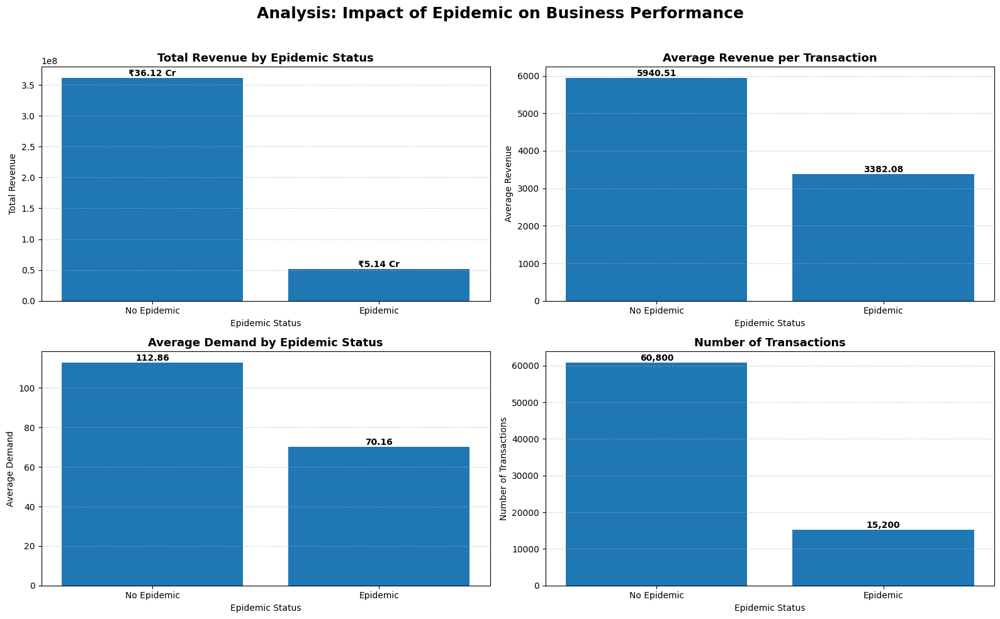

In [ ]:
import matplotlib.pyplot as plt

epidemic_summary = df.groupby('Epidemic').agg(
    Avg_Revenue=('Revenue', 'mean'),
    Total_Revenue=('Revenue', 'sum'),
    Avg_Demand=('Demand', 'mean'),
    Total_Demand=('Demand', 'sum'),
    Transactions=('Epidemic', 'count')
)

epidemic_summary.index = epidemic_summary.index.map({
    0: 'No Epidemic',
    1: 'Epidemic'
})

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

fig.suptitle(
    'Analysis: Impact of Epidemic on Business Performance',
    fontsize=18,
    fontweight='bold'
)

def add_labels(ax, bars, format_type='normal'):

    for bar in bars:

        height = bar.get_height()

        if format_type == 'crore':
            label = f'₹{height/1e7:.2f} Cr'

        elif format_type == 'million':
            label = f'{height/1e6:.2f} M'

        elif format_type == 'integer':
            label = f'{height:,.0f}'

        else:
            label = f'{height:.2f}'

        ax.text(
            bar.get_x() + bar.get_width()/2,
            height,
            label,
            ha='center',
            va='bottom',
            fontsize=10,
            fontweight='bold'
        )

bars = axes[0, 0].bar(
    epidemic_summary.index,
    epidemic_summary['Total_Revenue']
)

axes[0, 0].set_title(
    'Total Revenue by Epidemic Status',
    fontsize=13,
    fontweight='bold'
)

axes[0, 0].set_xlabel('Epidemic Status')
axes[0, 0].set_ylabel('Total Revenue')

axes[0, 0].grid(
    axis='y',
    linestyle='--',
    alpha=0.5
)

add_labels(axes[0, 0], bars, 'crore')


bars = axes[0, 1].bar(
    epidemic_summary.index,
    epidemic_summary['Avg_Revenue']
)

axes[0, 1].set_title(
    'Average Revenue per Transaction',
    fontsize=13,
    fontweight='bold'
)

axes[0, 1].set_xlabel('Epidemic Status')
axes[0, 1].set_ylabel('Average Revenue')

axes[0, 1].grid(
    axis='y',
    linestyle='--',
    alpha=0.5
)

add_labels(axes[0, 1], bars)


bars = axes[1, 0].bar(
    epidemic_summary.index,
    epidemic_summary['Avg_Demand']
)

axes[1, 0].set_title(
    'Average Demand by Epidemic Status',
    fontsize=13,
    fontweight='bold'
)

axes[1, 0].set_xlabel('Epidemic Status')
axes[1, 0].set_ylabel('Average Demand')

axes[1, 0].grid(
    axis='y',
    linestyle='--',
    alpha=0.5
)

add_labels(axes[1, 0], bars)


bars = axes[1, 1].bar(
    epidemic_summary.index,
    epidemic_summary['Transactions']
)

axes[1, 1].set_title(
    'Number of Transactions',
    fontsize=13,
    fontweight='bold'
)

axes[1, 1].set_xlabel('Epidemic Status')
axes[1, 1].set_ylabel('Number of Transactions')

axes[1, 1].grid(
    axis='y',
    linestyle='--',
    alpha=0.5
)

add_labels(axes[1, 1], bars, 'integer')

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

#Demand Vs Units Solved

In [ ]:
demand_sales_corr = df['Demand'].corr(df['Units Sold'])
print(
    "Correlation between Demand and Units Sold:",
    round(demand_sales_corr, 3)
)

Correlation between Demand and Units Sold: 0.833


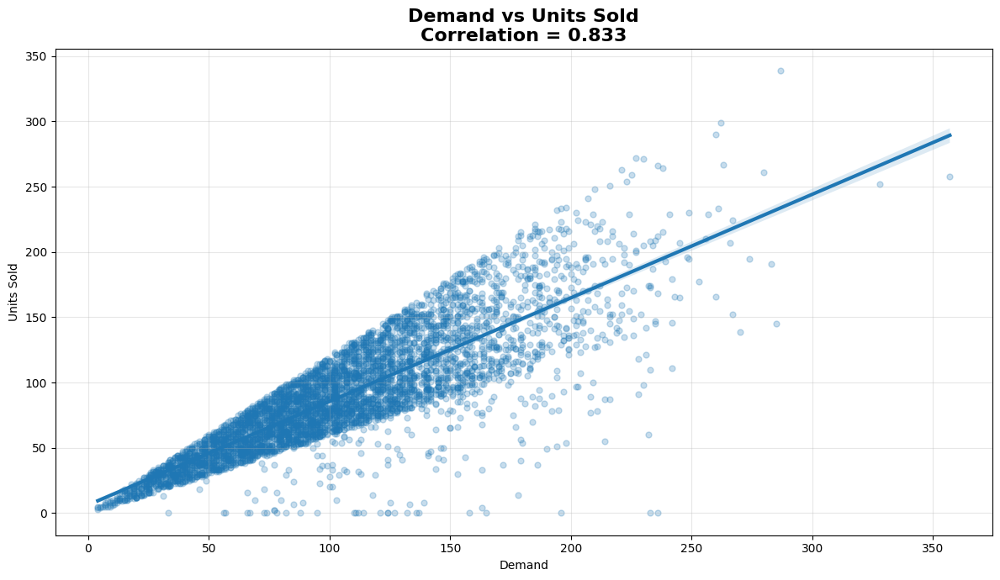

In [ ]:
sample_df = df.sample(5000, random_state=42)

plt.figure(figsize=(12, 7))

sns.regplot(
    data=sample_df,
    x='Demand',
    y='Units Sold',
    scatter_kws={'alpha': 0.25, 's': 25},
    line_kws={'linewidth': 3}
)

plt.title(
    f'Demand vs Units Sold\nCorrelation = {demand_sales_corr:.3f}',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Demand')
plt.ylabel('Units Sold')

plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

#Demand Vs Revenue

In [ ]:
demand_revenue_corr = df['Demand'].corr(df['Revenue'])

print(
    "Correlation between Demand and Revenue:",
    round(demand_revenue_corr, 3)
)

Correlation between Demand and Revenue: 0.47


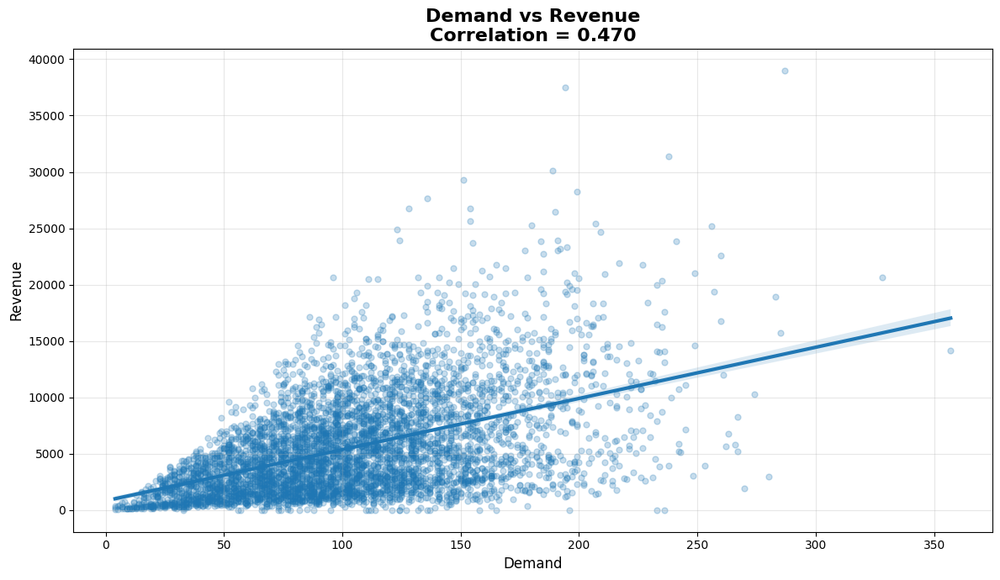

In [ ]:
sample_df = df.sample(5000, random_state=42)

plt.figure(figsize=(12, 7))

sns.regplot(
    data=sample_df,
    x='Demand',
    y='Revenue',
    scatter_kws={
        'alpha': 0.25,
        's': 25
    },
    line_kws={
        'linewidth': 3
    }
)

plt.title(
    f'Demand vs Revenue\nCorrelation = {demand_revenue_corr:.3f}',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('Demand', fontsize=12)
plt.ylabel('Revenue', fontsize=12)

plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

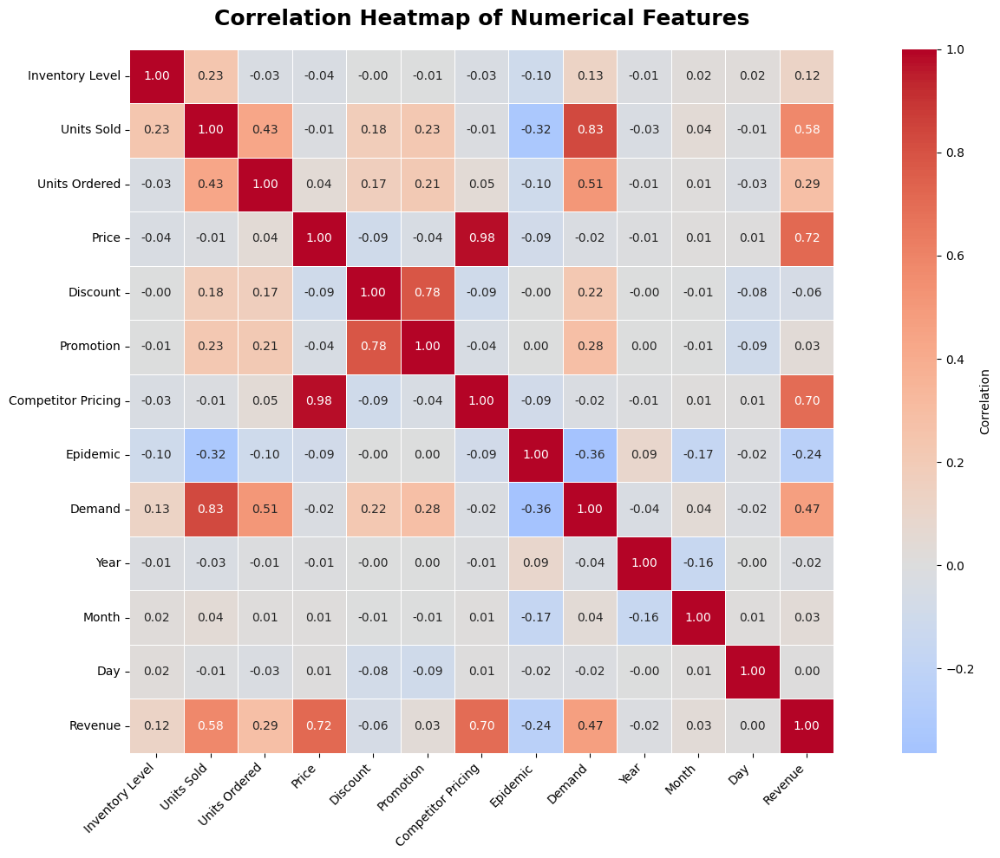

In [ ]:


def plot_correlation_heatmap(df):

    numeric_df = df.select_dtypes(include='number')

    correlation = numeric_df.corr()

    plt.figure(figsize=(16, 10))

    sns.heatmap(
        correlation,
        annot=True,
        fmt='.2f',
        cmap='coolwarm',
        center=0,
        linewidths=0.5,
        square=True,
        cbar_kws={'label': 'Correlation'}
    )

    plt.title(
        'Correlation Heatmap of Numerical Features',
        fontsize=18,
        fontweight='bold',
        pad=20
    )

    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)

    plt.tight_layout()
    plt.show()

plot_correlation_heatmap(df)

#As Demand increases, Units Sold also tends to increase.

#Outliers Detection --IQR


In [ ]:
def detect_outliers(df):

    columns = [
        'Inventory Level',
        'Units Sold',
        'Units Ordered',
        'Price',
        'Discount',
        'Competitor Pricing',
        'Demand',
        'Revenue'
    ]

    results = []

    for column in columns:

        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)

        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = df[
            (df[column] < lower_bound) |
            (df[column] > upper_bound)
        ]

        results.append({
            'Column': column,
            'Q1': Q1,
            'Q3': Q3,
            'IQR': IQR,
            'Outliers': len(outliers),
            'Outlier %': len(outliers) / len(df) * 100
        })

    return pd.DataFrame(results)

outlier_results = detect_outliers(df)

display(outlier_results.round(2))

,Column,Q1,Q3,IQR,Outliers,Outlier %
0,Inventory Level,136.00,408.00,272.00,2759,3.63
1,Units Sold,58.00,114.00,56.00,1411,1.86
2,Units Ordered,0.00,121.00,121.00,7524,9.90
3,Price,32.00,95.83,63.83,70,0.09
4,Discount,5.00,10.00,5.00,12413,16.33
5,Competitor Pricing,32.62,97.93,65.31,185,0.24
6,Demand,71.00,133.00,62.00,986,1.30
7,Revenue,2199.02,7595.92,5396.90,2209,2.91


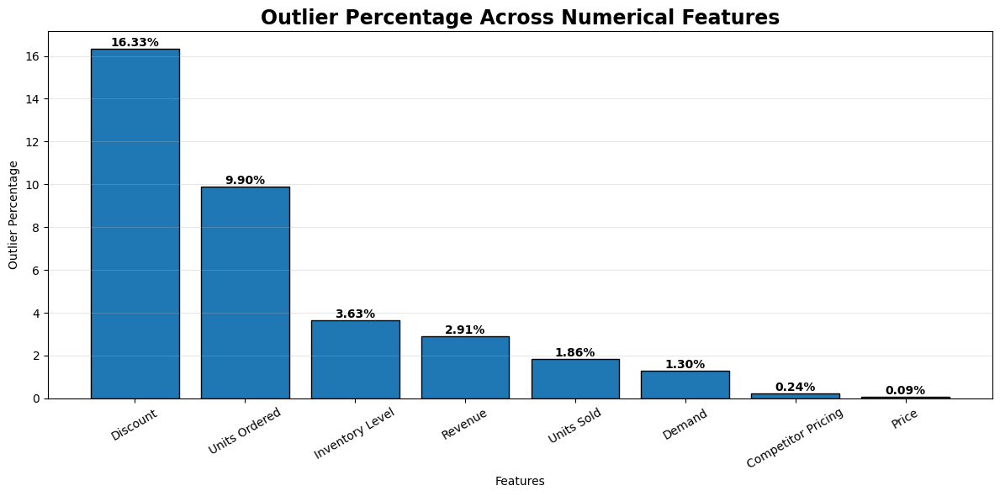

In [ ]:
def plot_outliers(outlier_results):
    data = outlier_results.sort_values(
        'Outlier %',
        ascending=False
    )
    plt.figure(figsize=(12, 6))
    bars = plt.bar(
        data['Column'],
        data['Outlier %'],
        edgecolor='black'
    )

    for bar, value in zip(bars, data['Outlier %']):

        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            f'{value:.2f}%',
            ha='center',
            va='bottom',
            fontweight='bold'
        )

    plt.title(
        'Outlier Percentage Across Numerical Features',
        fontsize=17,
        fontweight='bold'
    )

    plt.xlabel('Features')
    plt.ylabel('Outlier Percentage')

    plt.xticks(rotation=30)
    plt.grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.show()

plot_outliers(outlier_results)

In [ ]:
import plotly.express as px

numeric_columns = [
    'Inventory Level',
    'Units Sold',
    'Units Ordered',
    'Price',
    'Discount',
    'Competitor Pricing',
    'Demand',
    'Revenue'
]

numeric_df = df[numeric_columns]

fig = px.box(
    numeric_df,
    title='Distribution and Outlier Analysis of Numerical Features'
)

fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    title_font_size=20,
    height=650,
    xaxis_title='Variables',
    yaxis_title='Values'
)

fig.show()

In [ ]:
df_clean = df.copy()

In [ ]:
# Create a copy of the original dataset
df_clean = df.copy()

# Columns selected for outlier removal
outlier_columns = [
    'Inventory Level',
    'Units Sold',
    'Units Ordered',
    'Price',
    'Competitor Pricing',
    'Demand',
    'Revenue'
]

# Remove outliers using the IQR method
for column in outlier_columns:

    Q1 = df_clean[column].quantile(0.25)
    Q3 = df_clean[column].quantile(0.75)

    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    df_clean = df_clean[
        (df_clean[column] >= lower_bound) &
        (df_clean[column] <= upper_bound)
    ]

print("Original dataset shape:", df.shape)
print("Cleaned dataset shape:", df_clean.shape)

print(
    "Rows removed:",
    len(df) - len(df_clean)
)

print(
    "Percentage removed:",
    round(
        (len(df) - len(df_clean)) / len(df) * 100,
        2
    ),
    "%"
)

Original dataset shape: (76000, 21)
Cleaned dataset shape: (62904, 21)
Rows removed: 13096
Percentage removed: 17.23 %


In [ ]:
df_clean = df.copy()

print("Dataset shape:", df_clean.shape)

Dataset shape: (76000, 21)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                76000 non-null  datetime64[ns]
 1   Store ID            76000 non-null  object        
 2   Product ID          76000 non-null  object        
 3   Category            76000 non-null  object        
 4   Region              76000 non-null  object        
 5   Inventory Level     76000 non-null  int64         
 6   Units Sold          76000 non-null  int64         
 7   Units Ordered       76000 non-null  int64         
 8   Price               76000 non-null  float64       
 9   Discount            76000 non-null  int64         
 10  Weather Condition   76000 non-null  object        
 11  Promotion           76000 non-null  int64         
 12  Competitor Pricing  76000 non-null  float64       
 13  Seasonality         76000 non-null  object    

In [ ]:
numeric_columns = [
    'Inventory Level',
    'Units Sold',
    'Units Ordered',
    'Price',
    'Discount',
    'Promotion',
    'Competitor Pricing',
    'Epidemic',
    'Demand',
    'Revenue'
]

for column in numeric_columns:

    negative_count = (df[column] < 0).sum()
    zero_count = (df[column] == 0).sum()

    print(
        f'{column}: '
        f'Negative = {negative_count}, '
        f'Zero = {zero_count}'
    )

Inventory Level: Negative = 0, Zero = 406
Units Sold: Negative = 0, Zero = 406
Units Ordered: Negative = 0, Zero = 47107
Price: Negative = 0, Zero = 0
Discount: Negative = 0, Zero = 17126
Promotion: Negative = 0, Zero = 51000
Competitor Pricing: Negative = 0, Zero = 0
Epidemic: Negative = 0, Zero = 60800
Demand: Negative = 0, Zero = 0
Revenue: Negative = 0, Zero = 406


In [ ]:
zero_relationship = df[
    (df['Inventory Level'] == 0) |
    (df['Units Sold'] == 0) |
    (df['Revenue'] == 0)
]

display(
    zero_relationship[
        ['Inventory Level', 'Units Sold', 'Revenue']
    ].value_counts()
)

,,,count
Inventory Level,Units Sold,Revenue,
0,0,0.0,406


In [ ]:
print(
    "Rows where all three are zero:",
    (
        (df['Inventory Level'] == 0) &
        (df['Units Sold'] == 0) &
        (df['Revenue'] == 0)
    ).sum()
)

Rows where all three are zero: 406


In [ ]:
numeric_columns = [
    'Inventory Level',
    'Units Sold',
    'Units Ordered',
    'Price',
    'Discount',
    'Promotion',
    'Competitor Pricing',
    'Epidemic',
    'Demand',
    'Revenue'
]

correlation_matrix = df[numeric_columns].corr()

display(correlation_matrix.round(2))

,Inventory Level,Units Sold,Units Ordered,Price,Discount,Promotion,Competitor Pricing,Epidemic,Demand,Revenue
Inventory Level,1.00,0.23,-0.03,-0.04,-0.00,-0.01,-0.03,-0.10,0.13,0.12
Units Sold,0.23,1.00,0.43,-0.01,0.18,0.23,-0.01,-0.32,0.83,0.58
Units Ordered,-0.03,0.43,1.00,0.04,0.17,0.21,0.05,-0.10,0.51,0.29
Price,-0.04,-0.01,0.04,1.00,-0.09,-0.04,0.98,-0.09,-0.02,0.72
Discount,-0.00,0.18,0.17,-0.09,1.00,0.78,-0.09,-0.00,0.22,-0.06
Promotion,-0.01,0.23,0.21,-0.04,0.78,1.00,-0.04,0.00,0.28,0.03
Competitor Pricing,-0.03,-0.01,0.05,0.98,-0.09,-0.04,1.00,-0.09,-0.02,0.70
Epidemic,-0.10,-0.32,-0.10,-0.09,-0.00,0.00,-0.09,1.00,-0.36,-0.24
Demand,0.13,0.83,0.51,-0.02,0.22,0.28,-0.02,-0.36,1.00,0.47
Revenue,0.12,0.58,0.29,0.72,-0.06,0.03,0.70,-0.24,0.47,1.00


#Multicolinearity Analysis

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

vif_columns = [
    'Inventory Level',
    'Units Sold',
    'Units Ordered',
    'Price',
    'Discount',
    'Promotion',
    'Competitor Pricing',
    'Epidemic',
    'Demand'
]

X = df[vif_columns]

vif_data = pd.DataFrame()

vif_data['Feature'] = X.columns

vif_data['VIF'] = [
    variance_inflation_factor(X.values, i)
    for i in range(X.shape[1])
]

display(
    vif_data.sort_values(
        by='VIF',
        ascending=False
    )
)

,Feature,VIF
3,Price,85.070189
6,Competitor Pricing,83.969219
8,Demand,19.263748
1,Units Sold,17.637850
4,Discount,5.813013
5,Promotion,3.811044
0,Inventory Level,2.813796
2,Units Ordered,1.735853
7,Epidemic,1.197172


In [ ]:
price_comparison = df[
    ['Price', 'Competitor Pricing']
]

display(
    price_comparison.describe().round(2)
)

,Price,Competitor Pricing
count,76000.00,76000.00
mean,67.73,69.45
std,39.38,40.94
min,4.74,4.29
25%,32.00,32.62
50%,64.50,65.70
75%,95.83,97.93
max,228.03,261.22


In [ ]:
import plotly.express as px

fig = px.scatter(
    df.sample(5000, random_state=42),
    x='Price',
    y='Competitor Pricing',
    trendline='ols',
    opacity=0.4,
    title='Price vs Competitor Pricing'
)

fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    title_font_size=20,
    height=600
)

fig.show()

#price difference

In [ ]:
df['Price Difference'] = (
    df['Price'] -
    df['Competitor Pricing']
)

In [ ]:
display(
    df['Price Difference']
    .describe()
    .round(2)
)

,Price Difference
count,76000.00
mean,-1.73
std,8.82
min,-45.38
25%,-7.23
50%,0.03
75%,3.75
max,33.09


In [ ]:
df['Relative Price Difference'] = (
    (df['Price'] - df['Competitor Pricing'])
    / df['Competitor Pricing']
)

In [ ]:
df['Relative Price Difference %'] = (
    df['Relative Price Difference'] * 100
)

In [ ]:
import plotly.express as px

fig = px.histogram(
    df,
    x='Relative Price Difference %',
    nbins=50,
    title='Distribution of Relative Price Difference'
)

fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    xaxis_title='Relative Price Difference (%)',
    yaxis_title='Number of Records'
)

fig.show()

#product price is approximately ₹1.73 lower than the competitor's price.

In [ ]:
df['Price Position'] = pd.cut(
    df['Relative Price Difference %'],
    bins=[
        -np.inf,
        -5,
        5,
        np.inf
    ],
    labels=[
        'Cheaper than Competitor',
        'Similar to Competitor',
        'More Expensive than Competitor'
    ]
)

display(
    df['Price Position']
    .value_counts()
)

,count
Price Position,
Cheaper than Competitor,37810
More Expensive than Competitor,25925
Similar to Competitor,12265


In [ ]:
price_position_analysis = (
    df.groupby(
        'Price Position',
        observed=True
    )
    .agg(
        Average_Units_Sold=(
            'Units Sold',
            'mean'
        ),
        Average_Demand=(
            'Demand',
            'mean'
        ),
        Total_Revenue=(
            'Revenue',
            'sum'
        ),
        Average_Revenue=(
            'Revenue',
            'mean'
        ),
        Average_Discount=(
            'Discount',
            'mean'
        ),
        Records=(
            'Revenue',
            'count'
        )
    )
)

display(price_position_analysis.round(2))

,Average_Units_Sold,Average_Demand,Total_Revenue,Average_Revenue,Average_Discount,Records
Price Position,,,,,,
Cheaper than Competitor,88.92,104.29,2.006767e+08,5307.50,9.09,37810
Similar to Competitor,88.51,104.04,6.725481e+07,5483.47,9.08,12265
More Expensive than Competitor,88.84,104.49,1.446591e+08,5579.91,9.09,25925


In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

price_position_analysis = (
    df.groupby(
        'Price Position',
        observed=True
    )
    .agg(
        Average_Units_Sold=('Units Sold', 'mean'),
        Average_Demand=('Demand', 'mean'),
        Total_Revenue=('Revenue', 'sum'),
        Average_Revenue=('Revenue', 'mean'),
        Records=('Revenue', 'count')
    )
    .reindex([
        'Cheaper than Competitor',
        'Similar to Competitor',
        'More Expensive than Competitor'
    ])
)

fig = make_subplots(
    rows=2,
    cols=2,
    subplot_titles=(
        'Average Units Sold',
        'Average Demand',
        'Total Revenue',
        'Number of Records'
    )
)

fig.add_trace(
    go.Bar(
        x=price_position_analysis.index,
        y=price_position_analysis['Average_Units_Sold'],
        text=price_position_analysis[
            'Average_Units_Sold'
        ].round(2),
        textposition='outside'
    ),
    row=1,
    col=1
)

fig.add_trace(
    go.Bar(
        x=price_position_analysis.index,
        y=price_position_analysis['Average_Demand'],
        text=price_position_analysis[
            'Average_Demand'
        ].round(2),
        textposition='outside'
    ),
    row=1,
    col=2
)

fig.add_trace(
    go.Bar(
        x=price_position_analysis.index,
        y=price_position_analysis['Total_Revenue'],
        text=[
            f'₹{value / 1e7:.2f} Cr'
            for value in price_position_analysis[
                'Total_Revenue'
            ]
        ],
        textposition='outside'
    ),
    row=2,
    col=1
)

fig.add_trace(
    go.Bar(
        x=price_position_analysis.index,
        y=price_position_analysis['Records'],
        text=price_position_analysis['Records'],
        textposition='outside'
    ),
    row=2,
    col=2
)

fig.update_layout(
    title='Business Performance by Competitive Price Position',
    template='plotly_white',
    height=800,
    width=1200,
    showlegend=False
)

fig.update_xaxes(
    tickangle=-15
)

fig.update_yaxes(
    showgrid=True,
    gridcolor='lightgray'
)

fig.show()

In [ ]:
import plotly.express as px

fig = px.bar(
    price_position_analysis.reset_index(),
    x='Price Position',
    y='Average_Revenue',
    text='Average_Revenue',
    title='Average Revenue by Competitive Price Position'
)

fig.update_traces(
    texttemplate='₹%{text:,.2f}',
    textposition='outside'
)

fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    height=550,
    xaxis_title='Price Position',
    yaxis_title='Average Revenue (₹)'
)

fig.show()

* Competitive price positioning shows minimal influence on average units sold and demand. Despite substantial differences in price position, average units sold remain approximately 88–89 units and average demand remains approximately 104 units across all categories. The higher total revenue observed for cheaper products is largely influenced by the higher number of observations in that category. Therefore, average revenue should be analyzed to evaluate the actual revenue efficiency of each pricing position.

In [ ]:
print("Start Date:", df['Date'].min())
print("End Date:", df['Date'].max())

print("\nUnique Dates:", df['Date'].nunique())

print("\nRecords by Year:")

display(
    df['Year']
    .value_counts()
    .sort_index()
)

Start Date: 2022-01-01 00:00:00
End Date: 2024-01-30 00:00:00

Unique Dates: 760

Records by Year:


,count
Year,
2022,36500
2023,36500
2024,3000


# **Monthly** Revenue Trend and Monthly Demand Trend

In [ ]:
monthly_analysis = (
    df.groupby(
        df['Date'].dt.to_period('M')
    )
    .agg(
        Total_Revenue=('Revenue', 'sum'),
        Total_Demand=('Demand', 'sum'),
        Average_Units_Sold=('Units Sold', 'mean')
    )
    .reset_index()
)

monthly_analysis['Date'] = (
    monthly_analysis['Date']
    .astype(str)
)

monthly_analysis

,Date,Total_Revenue,Total_Demand,Average_Units_Sold
0,2022-01,1.762094e+07,341544,91.450000
1,2022-02,1.704631e+07,319883,96.824286
2,2022-03,1.852041e+07,353173,97.984516
3,2022-04,1.569041e+07,305076,86.937333
4,2022-05,1.171124e+07,239112,66.435161
5,2022-06,1.817486e+07,345725,97.605333
6,2022-07,1.283427e+07,259736,71.018387
7,2022-08,1.997949e+07,370437,102.162903
8,2022-09,1.697838e+07,324264,92.383667
9,2022-10,1.707049e+07,329865,90.395806


In [ ]:


monthly_analysis['Date'] = pd.to_datetime(
    monthly_analysis['Date']
)

fig = make_subplots(
    rows=2,
    cols=1,
    shared_xaxes=True,
    subplot_titles=(
        'Monthly Revenue Trend',
        'Monthly Demand Trend'
    ),
    vertical_spacing=0.12
)

fig.add_trace(
    go.Scatter(
        x=monthly_analysis['Date'],
        y=monthly_analysis['Total_Revenue'],
        mode='lines+markers',
        name='Revenue'
    ),
    row=1,
    col=1
)

fig.add_trace(
    go.Scatter(
        x=monthly_analysis['Date'],
        y=monthly_analysis['Total_Demand'],
        mode='lines+markers',
        name='Demand'
    ),
    row=2,
    col=1
)

fig.update_layout(
    title='Monthly Business Performance Trends',
    template='plotly_white',
    height=700,
    width=1200,
    showlegend=False
)

fig.update_yaxes(
    title_text='Revenue (₹)',
    row=1,
    col=1
)

fig.update_yaxes(
    title_text='Demand',
    row=2,
    col=1
)

fig.update_xaxes(
    title_text='Month',
    row=2,
    col=1
)

fig.show()

In [ ]:
daily_analysis = (
    df.groupby('Date')
    .agg(
        Daily_Revenue=('Revenue', 'sum'),
        Daily_Demand=('Demand', 'sum'),
        Daily_Units_Sold=('Units Sold', 'sum')
    )
    .reset_index()
)

daily_analysis['Year'] = daily_analysis['Date'].dt.year
daily_analysis['Month'] = daily_analysis['Date'].dt.month

In [ ]:
monthly_daily_analysis = (
    daily_analysis
    .groupby(['Year', 'Month'])
    .agg(
        Average_Daily_Revenue=(
            'Daily_Revenue',
            'mean'
        ),
        Average_Daily_Demand=(
            'Daily_Demand',
            'mean'
        ),
        Average_Daily_Units_Sold=(
            'Daily_Units_Sold',
            'mean'
        )
    )
    .reset_index()
)

In [ ]:
import plotly.express as px

fig = px.line(
    monthly_daily_analysis,
    x='Month',
    y='Average_Daily_Revenue',
    color='Year',
    markers=True,
    title='Average Daily Revenue by Month and Year'
)

fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    xaxis_title='Month',
    yaxis_title='Average Daily Revenue (₹)',
    height=550,
    width=1100
)

fig.show()

In [ ]:
fig = px.line(
    monthly_daily_analysis,
    x='Month',
    y='Average_Daily_Demand',
    color='Year',
    markers=True,
    title='Average Daily Demand by Month and Year'
)

fig.update_layout(
    template='plotly_white',
    title_x=0.5,
    xaxis_title='Month',
    yaxis_title='Average Daily Demand',
    height=550,
    width=1100
)

fig.show()

In [ ]:
print("Unique Stores:", df['Store ID'].nunique())

print("Unique Products:", df['Product ID'].nunique())

print("Unique Categories:", df['Category'].nunique())

print("Unique Regions:", df['Region'].nunique())

print("Unique Weather Conditions:",
      df['Weather Condition'].nunique())

print("Unique Seasons:",
      df['Seasonality'].nunique())

Unique Stores: 5
Unique Products: 20
Unique Categories: 5
Unique Regions: 4
Unique Weather Conditions: 4
Unique Seasons: 4


In [ ]:
display(
    df[
        [
            'Store ID',
            'Product ID',
            'Category',
            'Region',
            'Weather Condition',
            'Seasonality'
        ]
    ].nunique()
)

,0
Store ID,5
Product ID,20
Category,5
Region,4
Weather Condition,4
Seasonality,4


#checking Dataset Granuality

In [ ]:
daily_records = (
    df.groupby('Date')
    .size()
)

print("Minimum records per date:", daily_records.min())
print("Maximum records per date:", daily_records.max())
print("Average records per date:", daily_records.mean())

display(daily_records.describe())

Minimum records per date: 100
Maximum records per date: 100
Average records per date: 100.0


,0
count,760.0
mean,100.0
std,0.0
min,100.0
25%,100.0
50%,100.0
75%,100.0
max,100.0


In [ ]:
print(
    df.groupby(['Date', 'Store ID', 'Product ID'])
    .size()
    .value_counts()
    .sort_index()
)

1    76000
Name: count, dtype: int64


#leakage Check

In [ ]:
calculated_revenue = df['Units Sold'] * df['Price']

revenue_difference = (
    df['Revenue'] - calculated_revenue
)

exact_matches = np.isclose(
    df['Revenue'],
    calculated_revenue,
    rtol=1e-05,
    atol=1e-05
).sum()

print("Revenue Formula Analysis")
print("-" * 50)

print(
    "Exact Matches:",
    exact_matches
)

print(
    "Match Percentage:",
    round(
        exact_matches / len(df) * 100,
        2
    ),
    "%"
)

print(
    "\nMaximum Absolute Difference:",
    revenue_difference.abs().max()
)

print(
    "\nAverage Absolute Difference:",
    revenue_difference.abs().mean()
)

display(
    pd.DataFrame({
        'Actual Revenue': df['Revenue'],
        'Calculated Revenue': calculated_revenue,
        'Difference': revenue_difference
    }).describe().round(2)
)

Revenue Formula Analysis
--------------------------------------------------
Exact Matches: 17448
Match Percentage: 22.96 %

Maximum Absolute Difference: 10234.690000000002

Average Absolute Difference: 561.9671667894737


,Actual Revenue,Calculated Revenue,Difference
count,76000.00,76000.00,76000.00
mean,5428.82,5990.79,-561.97
std,4302.90,4756.21,763.49
min,0.00,0.00,-10234.69
25%,2199.02,2426.59,-747.40
50%,4337.61,4789.28,-302.68
75%,7595.92,8349.33,-42.77
max,62873.77,69859.74,0.00


In [ ]:
target_columns = [
    'Demand',
    'Units Sold',
    'Revenue'
]

target_relationships = (
    df[target_columns]
    .corr()
)

display(
    target_relationships.round(3)
)

,Demand,Units Sold,Revenue
Demand,1.000,0.833,0.470
Units Sold,0.833,1.000,0.583
Revenue,0.470,0.583,1.000


In [ ]:
revenue_correlations = (

    df[
        [
            'Inventory Level',
            'Units Sold',
            'Units Ordered',
            'Price',
            'Discount',
            'Promotion',
            'Competitor Pricing',
            'Epidemic',
            'Demand',
            'Revenue'
        ]
    ]

    .corr()['Revenue']

    .sort_values(
        ascending=False
    )
)

display(
    revenue_correlations.round(3)
)

,Revenue
Revenue,1.000
Price,0.715
Competitor Pricing,0.699
Units Sold,0.583
Demand,0.470
Units Ordered,0.286
Inventory Level,0.116
Promotion,0.031
Discount,-0.057
Epidemic,-0.238


In [ ]:
potential_leakage = []

correlations = (
    df[
        [
            'Inventory Level',
            'Units Sold',
            'Units Ordered',
            'Price',
            'Discount',
            'Promotion',
            'Competitor Pricing',
            'Epidemic',
            'Demand',
            'Revenue'
        ]
    ]
    .corr()
)

for column in correlations.columns:

    if column != 'Revenue':

        correlation = correlations.loc[
            column,
            'Revenue'
        ]

        if abs(correlation) > 0.90:

            potential_leakage.append({
                'Feature': column,
                'Correlation with Revenue': correlation,
                'Risk': 'Very High'
            })

        elif abs(correlation) > 0.75:

            potential_leakage.append({
                'Feature': column,
                'Correlation with Revenue': correlation,
                'Risk': 'High'
            })

        elif abs(correlation) > 0.50:

            potential_leakage.append({
                'Feature': column,
                'Correlation with Revenue': correlation,
                'Risk': 'Moderate'
            })

leakage_df = pd.DataFrame(
    potential_leakage
)

display(leakage_df)

,Feature,Correlation with Revenue,Risk
0,Units Sold,0.582752,Moderate
1,Price,0.715440,Moderate
2,Competitor Pricing,0.699162,Moderate


In [ ]:
feature_audit = pd.DataFrame({

    'Feature': [

        'Date',
        'Store ID',
        'Product ID',
        'Category',
        'Region',
        'Inventory Level',
        'Units Sold',
        'Units Ordered',
        'Price',
        'Discount',
        'Weather Condition',
        'Promotion',
        'Competitor Pricing',
        'Seasonality',
        'Epidemic',
        'Demand',
        'Year',
        'Month',
        'Day',
        'Revenue'
    ],

    'Feature Type': [

        'Time',
        'Categorical',
        'Categorical',
        'Categorical',
        'Categorical',
        'Business',
        'Business Outcome',
        'Business',
        'Pricing',
        'Pricing',
        'External',
        'Business',
        'External',
        'Time',
        'External',
        'Business Outcome',
        'Derived Time',
        'Derived Time',
        'Derived Time',
        'Business Outcome'
    ],

    'ML Usage': [

        'Use for feature engineering',
        'Use',
        'Use',
        'Use',
        'Use',
        'Use',
        'Depends on target',
        'Use',
        'Use',
        'Use',
        'Use if available before prediction',
        'Use',
        'Use',
        'Use',
        'Use',
        'Depends on target',
        'Use',
        'Use',
        'Use',
        'Target only if predicting Revenue'
    ]
})

display(feature_audit)

,Feature,Feature Type,ML Usage
0,Date,Time,Use for feature engineering
1,Store ID,Categorical,Use
2,Product ID,Categorical,Use
3,Category,Categorical,Use
4,Region,Categorical,Use
5,Inventory Level,Business,Use
6,Units Sold,Business Outcome,Depends on target
7,Units Ordered,Business,Use
8,Price,Pricing,Use
9,Discount,Pricing,Use


#Dataset Inspection
| Metric            |  Value |
| ----------------- | -----: |
| Total Records     | 76,000 |
| Total Features    |     21 |
| Missing Values    |      0 |
| Duplicate Records |      0 |

#Data Quality

The dataset was found to be highly structured:

1.   No missing values
2.   No duplicate records
3.   Appropriate numerical and categorical data types
4.   No records were removed during the cleaning process

#year-wise Revenue

| Year |   Total Revenue |
| ---- | --------------: |
| 2022 | ₹201.23 Million |
| 2023 | ₹196.15 Million |
| 2024 |  ₹15.21 Million |

#Regional Analysis

| Region |         Revenue |
| ------ | --------------: |
| North  | ₹154.14 Million |
| East   |  ₹89.26 Million |
| West   |  ₹85.60 Million |
| South  |  ₹83.59 Million |

#category wise Sales Analysis

| Category    | Units Sold |
| ----------- | ---------: |
| Groceries   |  3,127,335 |
| Clothing    |  1,150,873 |
| Furniture   |    880,654 |
| Toys        |    834,679 |
| Electronics |    757,335 |

#Seasonality and Demand Analysis

| Season | Average Demand |  Total Demand |
| ------ | -------------: | ------------: |
| Summer |     **112.86** |     2,076,539 |
| Autumn |         103.42 |     1,882,298 |
| Winter |         103.41 | **2,171,530** |
| Spring |          97.70 |     1,797,737 |



*   Sunny weather → Highest Demand
*   Snowy weather → Lowest Demand



In [ ]:
print("Dataset Shape:", df.shape)
print("Total Columns:", len(df.columns))

Dataset Shape: (76000, 25)
Total Columns: 25


In [ ]:
from google.colab import files
df.to_csv('sales_cleaned.csv', index=False)
files.download('sales_cleaned.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>